## Germany Offwind Cut Scenario with 130 €/t CO2 price

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [110]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\02042024_5nodes\\elec_s_5_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_5_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [111]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [112]:
#n.global_constraints.loc['CO2Limit','constant'] = 184500000 #TCO2 184500000

In [113]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 5 entries
Component 'Carrier' has 21 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 3 entries
Component 'Load' has 5 entries
Component 'Generator' has 66 entries
Component 'StorageUnit' has 17 entries


In [114]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [115]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [116]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:01<00:00,  8.12it/s]
INFO:linopy.io: Writing time: 9.82s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5xrnlyk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5xrnlyk.lp


Reading time = 3.08 seconds


INFO:gurobipy:Reading time = 3.08 seconds


obj: 805986 rows, 373779 columns, 1491764 nonzeros


INFO:gurobipy:obj: 805986 rows, 373779 columns, 1491764 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 805986 rows, 373779 columns and 1491764 nonzeros


INFO:gurobipy:Optimize a model with 805986 rows, 373779 columns and 1491764 nonzeros


Model fingerprint: 0xfcbe9316


INFO:gurobipy:Model fingerprint: 0xfcbe9316


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 5e+02]


INFO:gurobipy:  Matrix range     [1e-02, 5e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 549449 rows and 73480 columns


INFO:gurobipy:Presolve removed 549449 rows and 73480 columns


Presolve time: 2.28s


INFO:gurobipy:Presolve time: 2.28s


Presolved: 256537 rows, 300299 columns, 900956 nonzeros


INFO:gurobipy:Presolved: 256537 rows, 300299 columns, 900956 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.61s


INFO:gurobipy:Ordering time: 0.61s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 40


INFO:gurobipy: Dense cols : 40


 AA' NZ     : 8.547e+05


INFO:gurobipy: AA' NZ     : 8.547e+05


 Factor NZ  : 4.060e+06 (roughly 260 MB of memory)


INFO:gurobipy: Factor NZ  : 4.060e+06 (roughly 260 MB of memory)


 Factor Ops : 2.125e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.125e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.30642472e+17 -1.98722807e+18  3.97e+09 6.74e+04  4.97e+13     4s


INFO:gurobipy:   0   1.30642472e+17 -1.98722807e+18  3.97e+09 6.74e+04  4.97e+13     4s


   1   1.20298744e+17 -5.32372076e+17  3.54e+09 1.94e+04  3.04e+13     4s


INFO:gurobipy:   1   1.20298744e+17 -5.32372076e+17  3.54e+09 1.94e+04  3.04e+13     4s


   2   9.34013456e+16 -2.53749447e+17  2.51e+09 8.09e+03  2.01e+13     5s


INFO:gurobipy:   2   9.34013456e+16 -2.53749447e+17  2.51e+09 8.09e+03  2.01e+13     5s


   3   5.32457442e+16 -1.21857996e+17  7.35e+08 3.03e+03  6.41e+12     6s


INFO:gurobipy:   3   5.32457442e+16 -1.21857996e+17  7.35e+08 3.03e+03  6.41e+12     6s


   4   4.30494757e+16 -3.03202539e+16  2.95e+08 6.85e+02  2.41e+12     6s


INFO:gurobipy:   4   4.30494757e+16 -3.03202539e+16  2.95e+08 6.85e+02  2.41e+12     6s


   5   2.27471653e+16 -4.89455157e+15  7.86e+07 1.38e+02  6.38e+11     7s


INFO:gurobipy:   5   2.27471653e+16 -4.89455157e+15  7.86e+07 1.38e+02  6.38e+11     7s


   6   4.30048479e+15 -6.07704703e+14  3.37e+06 1.10e+01  3.45e+10     8s


INFO:gurobipy:   6   4.30048479e+15 -6.07704703e+14  3.37e+06 1.10e+01  3.45e+10     8s


   7   5.93282631e+14 -2.51391748e+14  1.12e+05 3.02e+00  2.37e+09     9s


INFO:gurobipy:   7   5.93282631e+14 -2.51391748e+14  1.12e+05 3.02e+00  2.37e+09     9s


   8   2.12704639e+14 -7.56193323e+13  2.81e+04 1.72e-01  6.22e+08     9s


INFO:gurobipy:   8   2.12704639e+14 -7.56193323e+13  2.81e+04 1.72e-01  6.22e+08     9s


   9   7.65169693e+13 -2.63027375e+13  9.35e+03 2.03e-03  2.02e+08    10s


INFO:gurobipy:   9   7.65169693e+13 -2.63027375e+13  9.35e+03 2.03e-03  2.02e+08    10s


  10   9.33362499e+11 -5.53421448e+12  3.43e+00 6.07e-04  9.96e+06    10s


INFO:gurobipy:  10   9.33362499e+11 -5.53421448e+12  3.43e+00 6.07e-04  9.96e+06    10s


  11   4.26548304e+11 -2.16400686e+12  9.93e-01 2.34e-04  3.99e+06    11s


INFO:gurobipy:  11   4.26548304e+11 -2.16400686e+12  9.93e-01 2.34e-04  3.99e+06    11s


  12   3.12497499e+11 -1.57210883e+12  6.43e-01 1.70e-04  2.90e+06    11s


INFO:gurobipy:  12   3.12497499e+11 -1.57210883e+12  6.43e-01 1.70e-04  2.90e+06    11s


  13   2.05647086e+11 -1.11318416e+12  3.35e-01 1.21e-04  2.03e+06    12s


INFO:gurobipy:  13   2.05647086e+11 -1.11318416e+12  3.35e-01 1.21e-04  2.03e+06    12s


  14   1.83093540e+11 -1.09508155e+12  2.85e-01 1.19e-04  1.97e+06    12s


INFO:gurobipy:  14   1.83093540e+11 -1.09508155e+12  2.85e-01 1.19e-04  1.97e+06    12s


  15   9.95704338e+10 -4.43655995e+11  1.06e-01 4.82e-05  8.36e+05    13s


INFO:gurobipy:  15   9.95704338e+10 -4.43655995e+11  1.06e-01 4.82e-05  8.36e+05    13s


  16   6.87151604e+10 -2.21441143e+11  5.72e-02 2.49e-05  4.47e+05    13s


INFO:gurobipy:  16   6.87151604e+10 -2.21441143e+11  5.72e-02 2.49e-05  4.47e+05    13s


  17   5.72771358e+10 -1.49658107e+11  3.92e-02 1.75e-05  3.18e+05    14s


INFO:gurobipy:  17   5.72771358e+10 -1.49658107e+11  3.92e-02 1.75e-05  3.18e+05    14s


  18   5.00304961e+10 -1.05951491e+11  2.86e-02 1.31e-05  2.40e+05    14s


INFO:gurobipy:  18   5.00304961e+10 -1.05951491e+11  2.86e-02 1.31e-05  2.40e+05    14s


  19   4.65339923e+10 -7.62841221e+10  2.40e-02 1.01e-05  1.89e+05    15s


INFO:gurobipy:  19   4.65339923e+10 -7.62841221e+10  2.40e-02 1.01e-05  1.89e+05    15s


  20   4.24938823e+10 -5.68091154e+10  1.87e-02 8.14e-06  1.53e+05    15s


INFO:gurobipy:  20   4.24938823e+10 -5.68091154e+10  1.87e-02 8.14e-06  1.53e+05    15s


  21   3.73585310e+10 -3.98601496e+10  1.22e-02 6.51e-06  1.19e+05    16s


INFO:gurobipy:  21   3.73585310e+10 -3.98601496e+10  1.22e-02 6.51e-06  1.19e+05    16s


  22   3.46955099e+10 -2.37157304e+10  9.04e-03 4.91e-06  8.99e+04    16s


INFO:gurobipy:  22   3.46955099e+10 -2.37157304e+10  9.04e-03 4.91e-06  8.99e+04    16s


  23   3.18353040e+10 -9.12692322e+09  6.05e-03 3.46e-06  6.30e+04    17s


INFO:gurobipy:  23   3.18353040e+10 -9.12692322e+09  6.05e-03 3.46e-06  6.30e+04    17s


  24   3.04150248e+10 -1.31573646e+09  4.85e-03 2.67e-06  4.88e+04    17s


INFO:gurobipy:  24   3.04150248e+10 -1.31573646e+09  4.85e-03 2.67e-06  4.88e+04    17s


  25   2.86739302e+10  6.41044119e+09  3.56e-03 1.84e-06  3.43e+04    18s


INFO:gurobipy:  25   2.86739302e+10  6.41044119e+09  3.56e-03 1.84e-06  3.43e+04    18s


  26   2.73481882e+10  9.65832214e+09  2.66e-03 1.49e-06  2.72e+04    19s


INFO:gurobipy:  26   2.73481882e+10  9.65832214e+09  2.66e-03 1.49e-06  2.72e+04    19s


  27   2.54460765e+10  1.36938209e+10  1.39e-03 1.04e-06  1.81e+04    20s


INFO:gurobipy:  27   2.54460765e+10  1.36938209e+10  1.39e-03 1.04e-06  1.81e+04    20s


  28   2.45704926e+10  1.59587380e+10  8.89e-04 7.87e-07  1.33e+04    21s


INFO:gurobipy:  28   2.45704926e+10  1.59587380e+10  8.89e-04 7.87e-07  1.33e+04    21s


  29   2.37432560e+10  1.75205301e+10  4.59e-04 6.06e-07  9.58e+03    22s


INFO:gurobipy:  29   2.37432560e+10  1.75205301e+10  4.59e-04 6.06e-07  9.58e+03    22s


  30   2.33383683e+10  1.84341020e+10  2.79e-04 5.02e-07  7.55e+03    22s


INFO:gurobipy:  30   2.33383683e+10  1.84341020e+10  2.79e-04 5.02e-07  7.55e+03    22s


  31   2.31434837e+10  1.87469176e+10  2.04e-04 4.62e-07  6.77e+03    23s


INFO:gurobipy:  31   2.31434837e+10  1.87469176e+10  2.04e-04 4.62e-07  6.77e+03    23s


  32   2.30044083e+10  2.00591092e+10  1.52e-04 3.04e-07  4.53e+03    23s


INFO:gurobipy:  32   2.30044083e+10  2.00591092e+10  1.52e-04 3.04e-07  4.53e+03    23s


  33   2.29375546e+10  2.05358613e+10  1.31e-04 2.48e-07  3.70e+03    24s


INFO:gurobipy:  33   2.29375546e+10  2.05358613e+10  1.31e-04 2.48e-07  3.70e+03    24s


  34   2.28223935e+10  2.11596969e+10  9.42e-05 1.75e-07  2.56e+03    24s


INFO:gurobipy:  34   2.28223935e+10  2.11596969e+10  9.42e-05 1.75e-07  2.56e+03    24s


  35   2.27339911e+10  2.14769793e+10  6.86e-05 1.33e-07  1.93e+03    25s


INFO:gurobipy:  35   2.27339911e+10  2.14769793e+10  6.86e-05 1.33e-07  1.93e+03    25s


  36   2.26543499e+10  2.16934744e+10  4.66e-05 1.04e-07  1.48e+03    26s


INFO:gurobipy:  36   2.26543499e+10  2.16934744e+10  4.66e-05 1.04e-07  1.48e+03    26s


  37   2.26086918e+10  2.17261580e+10  3.52e-05 1.02e-07  1.36e+03    26s


INFO:gurobipy:  37   2.26086918e+10  2.17261580e+10  3.52e-05 1.02e-07  1.36e+03    26s


  38   2.25970617e+10  2.18356563e+10  3.20e-05 8.72e-08  1.17e+03    27s


INFO:gurobipy:  38   2.25970617e+10  2.18356563e+10  3.20e-05 8.72e-08  1.17e+03    27s


  39   2.25730325e+10  2.19386801e+10  2.56e-05 7.30e-08  9.76e+02    27s


INFO:gurobipy:  39   2.25730325e+10  2.19386801e+10  2.56e-05 7.30e-08  9.76e+02    27s


  40   2.25674965e+10  2.19475775e+10  2.43e-05 7.07e-08  9.54e+02    28s


INFO:gurobipy:  40   2.25674965e+10  2.19475775e+10  2.43e-05 7.07e-08  9.54e+02    28s


  41   2.25432745e+10  2.20606791e+10  1.84e-05 5.52e-08  7.43e+02    28s


INFO:gurobipy:  41   2.25432745e+10  2.20606791e+10  1.84e-05 5.52e-08  7.43e+02    28s


  42   2.25290620e+10  2.20861096e+10  1.51e-05 5.25e-08  6.82e+02    29s


INFO:gurobipy:  42   2.25290620e+10  2.20861096e+10  1.51e-05 5.25e-08  6.82e+02    29s


  43   2.25120376e+10  2.21119234e+10  1.13e-05 4.94e-08  6.16e+02    30s


INFO:gurobipy:  43   2.25120376e+10  2.21119234e+10  1.13e-05 4.94e-08  6.16e+02    30s


  44   2.25105025e+10  2.21344502e+10  1.09e-05 4.57e-08  5.79e+02    30s


INFO:gurobipy:  44   2.25105025e+10  2.21344502e+10  1.09e-05 4.57e-08  5.79e+02    30s


  45   2.25060321e+10  2.21917950e+10  9.88e-06 3.69e-08  4.84e+02    31s


INFO:gurobipy:  45   2.25060321e+10  2.21917950e+10  9.88e-06 3.69e-08  4.84e+02    31s


  46   2.24906042e+10  2.22254149e+10  6.25e-06 3.24e-08  4.08e+02    31s


INFO:gurobipy:  46   2.24906042e+10  2.22254149e+10  6.25e-06 3.24e-08  4.08e+02    31s


  47   2.24825413e+10  2.22426729e+10  4.55e-06 2.96e-08  3.69e+02    32s


INFO:gurobipy:  47   2.24825413e+10  2.22426729e+10  4.55e-06 2.96e-08  3.69e+02    32s


  48   2.24781000e+10  2.22920142e+10  3.59e-06 2.42e-08  2.86e+02    33s


INFO:gurobipy:  48   2.24781000e+10  2.22920142e+10  3.59e-06 2.42e-08  2.86e+02    33s


  49   2.24730113e+10  2.23268361e+10  2.90e-06 2.02e-08  2.25e+02    34s


INFO:gurobipy:  49   2.24730113e+10  2.23268361e+10  2.90e-06 2.02e-08  2.25e+02    34s


  50   2.24704776e+10  2.23307528e+10  3.06e-06 1.81e-08  2.15e+02    34s


INFO:gurobipy:  50   2.24704776e+10  2.23307528e+10  3.06e-06 1.81e-08  2.15e+02    34s


  51   2.24686968e+10  2.23561180e+10  2.18e-06 1.67e-08  1.73e+02    35s


INFO:gurobipy:  51   2.24686968e+10  2.23561180e+10  2.18e-06 1.67e-08  1.73e+02    35s


  52   2.24683292e+10  2.23651515e+10  2.12e-06 1.53e-08  1.59e+02    36s


INFO:gurobipy:  52   2.24683292e+10  2.23651515e+10  2.12e-06 1.53e-08  1.59e+02    36s


  53   2.24658131e+10  2.23805612e+10  1.48e-06 1.21e-08  1.31e+02    37s


INFO:gurobipy:  53   2.24658131e+10  2.23805612e+10  1.48e-06 1.21e-08  1.31e+02    37s


  54   2.24649317e+10  2.23915496e+10  1.42e-06 9.99e-09  1.13e+02    38s


INFO:gurobipy:  54   2.24649317e+10  2.23915496e+10  1.42e-06 9.99e-09  1.13e+02    38s


  55   2.24644581e+10  2.23972389e+10  1.30e-06 9.45e-09  1.03e+02    39s


INFO:gurobipy:  55   2.24644581e+10  2.23972389e+10  1.30e-06 9.45e-09  1.03e+02    39s


  56   2.24639625e+10  2.24032554e+10  1.14e-06 9.14e-09  9.34e+01    39s


INFO:gurobipy:  56   2.24639625e+10  2.24032554e+10  1.14e-06 9.14e-09  9.34e+01    39s


  57   2.24634910e+10  2.24094320e+10  1.02e-06 7.90e-09  8.32e+01    40s


INFO:gurobipy:  57   2.24634910e+10  2.24094320e+10  1.02e-06 7.90e-09  8.32e+01    40s


  58   2.24628924e+10  2.24216801e+10  1.07e-06 6.37e-09  6.34e+01    41s


INFO:gurobipy:  58   2.24628924e+10  2.24216801e+10  1.07e-06 6.37e-09  6.34e+01    41s


  59   2.24624656e+10  2.24361137e+10  9.17e-07 2.09e-09  4.06e+01    42s


INFO:gurobipy:  59   2.24624656e+10  2.24361137e+10  9.17e-07 2.09e-09  4.06e+01    42s


  60   2.24607332e+10  2.24383200e+10  5.89e-07 3.62e-09  3.45e+01    42s


INFO:gurobipy:  60   2.24607332e+10  2.24383200e+10  5.89e-07 3.62e-09  3.45e+01    42s


  61   2.24605001e+10  2.24399236e+10  4.94e-07 3.78e-09  3.17e+01    43s


INFO:gurobipy:  61   2.24605001e+10  2.24399236e+10  4.94e-07 3.78e-09  3.17e+01    43s


  62   2.24603902e+10  2.24440244e+10  4.41e-07 4.04e-09  2.52e+01    44s


INFO:gurobipy:  62   2.24603902e+10  2.24440244e+10  4.41e-07 4.04e-09  2.52e+01    44s


  63   2.24601380e+10  2.24450605e+10  3.45e-07 2.44e-09  2.32e+01    44s


INFO:gurobipy:  63   2.24601380e+10  2.24450605e+10  3.45e-07 2.44e-09  2.32e+01    44s


  64   2.24599435e+10  2.24515945e+10  2.73e-07 7.42e-10  1.28e+01    45s


INFO:gurobipy:  64   2.24599435e+10  2.24515945e+10  2.73e-07 7.42e-10  1.28e+01    45s


  65   2.24596752e+10  2.24550972e+10  1.87e-07 1.35e-09  7.05e+00    46s


INFO:gurobipy:  65   2.24596752e+10  2.24550972e+10  1.87e-07 1.35e-09  7.05e+00    46s


  66   2.24596117e+10  2.24557262e+10  1.67e-07 1.34e-09  5.98e+00    46s


INFO:gurobipy:  66   2.24596117e+10  2.24557262e+10  1.67e-07 1.34e-09  5.98e+00    46s


  67   2.24595766e+10  2.24557682e+10  1.56e-07 4.22e-10  5.86e+00    47s


INFO:gurobipy:  67   2.24595766e+10  2.24557682e+10  1.56e-07 4.22e-10  5.86e+00    47s


  68   2.24593830e+10  2.24564694e+10  9.97e-08 1.65e-09  4.48e+00    48s


INFO:gurobipy:  68   2.24593830e+10  2.24564694e+10  9.97e-08 1.65e-09  4.48e+00    48s


  69   2.24593760e+10  2.24573807e+10  9.79e-08 8.51e-10  3.07e+00    48s


INFO:gurobipy:  69   2.24593760e+10  2.24573807e+10  9.79e-08 8.51e-10  3.07e+00    48s


  70   2.24591850e+10  2.24583197e+10  4.74e-08 1.40e-09  1.33e+00    49s


INFO:gurobipy:  70   2.24591850e+10  2.24583197e+10  4.74e-08 1.40e-09  1.33e+00    49s


  71   2.24591251e+10  2.24586603e+10  3.41e-08 2.82e-10  7.15e-01    50s


INFO:gurobipy:  71   2.24591251e+10  2.24586603e+10  3.41e-08 2.82e-10  7.15e-01    50s


  72   2.24590758e+10  2.24586880e+10  2.34e-08 9.82e-10  5.97e-01    50s


INFO:gurobipy:  72   2.24590758e+10  2.24586880e+10  2.34e-08 9.82e-10  5.97e-01    50s


  73   2.24590676e+10  2.24587372e+10  2.15e-08 8.15e-10  5.08e-01    51s


INFO:gurobipy:  73   2.24590676e+10  2.24587372e+10  2.15e-08 8.15e-10  5.08e-01    51s


  74   2.24590589e+10  2.24587908e+10  1.95e-08 7.86e-10  4.13e-01    51s


INFO:gurobipy:  74   2.24590589e+10  2.24587908e+10  1.95e-08 7.86e-10  4.13e-01    51s


  75   2.24590534e+10  2.24587998e+10  1.80e-08 3.86e-10  3.90e-01    51s


INFO:gurobipy:  75   2.24590534e+10  2.24587998e+10  1.80e-08 3.86e-10  3.90e-01    51s


  76   2.24590438e+10  2.24588345e+10  1.58e-08 1.78e-09  3.22e-01    52s


INFO:gurobipy:  76   2.24590438e+10  2.24588345e+10  1.58e-08 1.78e-09  3.22e-01    52s


  77   2.24590385e+10  2.24588557e+10  1.46e-08 2.76e-10  2.81e-01    52s


INFO:gurobipy:  77   2.24590385e+10  2.24588557e+10  1.46e-08 2.76e-10  2.81e-01    52s


  78   2.24590257e+10  2.24588653e+10  1.20e-08 6.33e-10  2.47e-01    53s


INFO:gurobipy:  78   2.24590257e+10  2.24588653e+10  1.20e-08 6.33e-10  2.47e-01    53s


  79   2.24590009e+10  2.24589190e+10  7.02e-09 6.98e-10  1.26e-01    53s


INFO:gurobipy:  79   2.24590009e+10  2.24589190e+10  7.02e-09 6.98e-10  1.26e-01    53s


  80   2.24589878e+10  2.24589357e+10  4.45e-09 8.44e-10  8.01e-02    54s


INFO:gurobipy:  80   2.24589878e+10  2.24589357e+10  4.45e-09 8.44e-10  8.01e-02    54s


  81   2.24589826e+10  2.24589445e+10  3.48e-09 1.14e-09  5.87e-02    54s


INFO:gurobipy:  81   2.24589826e+10  2.24589445e+10  3.48e-09 1.14e-09  5.87e-02    54s


  82   2.24589748e+10  2.24589527e+10  2.07e-09 1.03e-09  3.40e-02    55s


INFO:gurobipy:  82   2.24589748e+10  2.24589527e+10  2.07e-09 1.03e-09  3.40e-02    55s


  83   2.24589716e+10  2.24589559e+10  1.47e-09 5.75e-10  2.41e-02    55s


INFO:gurobipy:  83   2.24589716e+10  2.24589559e+10  1.47e-09 5.75e-10  2.41e-02    55s


  84   2.24589691e+10  2.24589592e+10  1.01e-09 1.46e-09  1.52e-02    56s


INFO:gurobipy:  84   2.24589691e+10  2.24589592e+10  1.01e-09 1.46e-09  1.52e-02    56s


  85   2.24589674e+10  2.24589607e+10  7.17e-10 5.82e-10  1.03e-02    56s


INFO:gurobipy:  85   2.24589674e+10  2.24589607e+10  7.17e-10 5.82e-10  1.03e-02    56s


  86   2.24589664e+10  2.24589618e+10  3.69e-09 1.35e-09  7.08e-03    57s


INFO:gurobipy:  86   2.24589664e+10  2.24589618e+10  3.69e-09 1.35e-09  7.08e-03    57s


  87   2.24589651e+10  2.24589625e+10  4.11e-09 7.20e-10  3.91e-03    58s


INFO:gurobipy:  87   2.24589651e+10  2.24589625e+10  4.11e-09 7.20e-10  3.91e-03    58s


  88   2.24589642e+10  2.24589628e+10  3.65e-07 1.79e-09  2.04e-03    59s


INFO:gurobipy:  88   2.24589642e+10  2.24589628e+10  3.65e-07 1.79e-09  2.04e-03    59s


  89   2.24589638e+10  2.24589630e+10  7.98e-06 1.08e-09  1.27e-03    59s


INFO:gurobipy:  89   2.24589638e+10  2.24589630e+10  7.98e-06 1.08e-09  1.27e-03    59s


  90   2.24589637e+10  2.24589631e+10  4.94e-06 1.24e-09  8.62e-04    60s


INFO:gurobipy:  90   2.24589637e+10  2.24589631e+10  4.94e-06 1.24e-09  8.62e-04    60s


  91   2.24589636e+10  2.24589632e+10  3.90e-06 9.75e-10  6.62e-04    60s


INFO:gurobipy:  91   2.24589636e+10  2.24589632e+10  3.90e-06 9.75e-10  6.62e-04    60s


  92   2.24589636e+10  2.24589632e+10  1.84e-05 1.60e-09  5.32e-04    60s


INFO:gurobipy:  92   2.24589636e+10  2.24589632e+10  1.84e-05 1.60e-09  5.32e-04    60s


  93   2.24589634e+10  2.24589633e+10  9.71e-06 7.09e-09  2.67e-04    61s


INFO:gurobipy:  93   2.24589634e+10  2.24589633e+10  9.71e-06 7.09e-09  2.67e-04    61s


INFO:gurobipy:


Barrier solved model in 93 iterations and 60.79 seconds (16.32 work units)


INFO:gurobipy:Barrier solved model in 93 iterations and 60.79 seconds (16.32 work units)


Optimal objective 2.24589634e+10


INFO:gurobipy:Optimal objective 2.24589634e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  118078 DPushes remaining with DInf 0.0000000e+00                61s


INFO:gurobipy:  118078 DPushes remaining with DInf 0.0000000e+00                61s


    4931 DPushes remaining with DInf 0.0000000e+00                65s


INFO:gurobipy:    4931 DPushes remaining with DInf 0.0000000e+00                65s


    1395 DPushes remaining with DInf 0.0000000e+00                70s


INFO:gurobipy:    1395 DPushes remaining with DInf 0.0000000e+00                70s


       0 DPushes remaining with DInf 0.0000000e+00                73s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                73s


INFO:gurobipy:


  194354 PPushes remaining with PInf 0.0000000e+00                73s


INFO:gurobipy:  194354 PPushes remaining with PInf 0.0000000e+00                73s


   48931 PPushes remaining with PInf 2.0334056e-01                76s


INFO:gurobipy:   48931 PPushes remaining with PInf 2.0334056e-01                76s


    6784 PPushes remaining with PInf 1.6179409e-01                80s


INFO:gurobipy:    6784 PPushes remaining with PInf 1.6179409e-01                80s


       0 PPushes remaining with PInf 0.0000000e+00                83s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                83s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4110685e+05     83s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.4110685e+05     83s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  257145    2.2458963e+10   0.000000e+00   2.411068e+05     83s


INFO:gurobipy:  257145    2.2458963e+10   0.000000e+00   2.411068e+05     83s


  257515    2.2458963e+10   0.000000e+00   1.831112e+05     85s


INFO:gurobipy:  257515    2.2458963e+10   0.000000e+00   1.831112e+05     85s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  259349    2.2458963e+10   0.000000e+00   0.000000e+00     88s


INFO:gurobipy:  259349    2.2458963e+10   0.000000e+00   0.000000e+00     88s


INFO:gurobipy:


Solved in 259349 iterations and 88.49 seconds (27.26 work units)


INFO:gurobipy:Solved in 259349 iterations and 88.49 seconds (27.26 work units)


Optimal objective  2.245896327e+10


INFO:gurobipy:Optimal objective  2.245896327e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 373779 primals, 805986 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [117]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [118]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


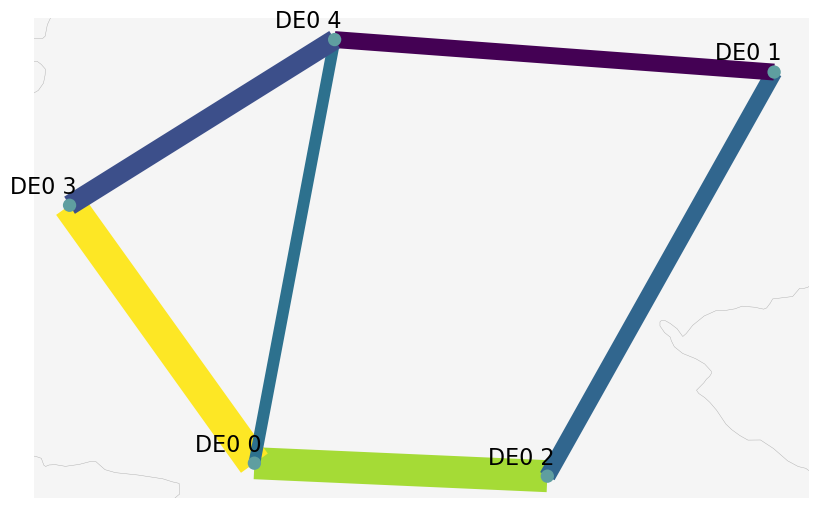

In [119]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [120]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


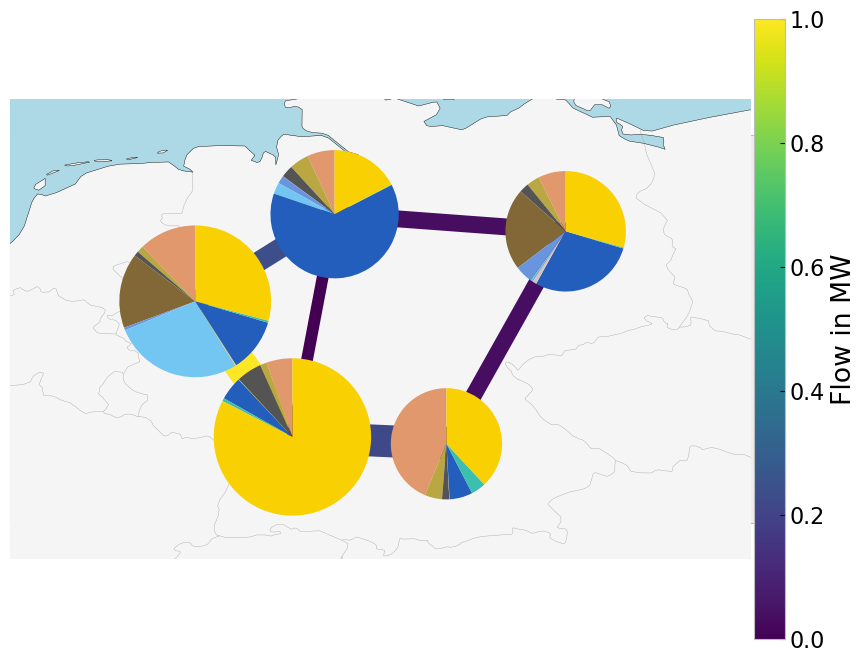

In [121]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [122]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


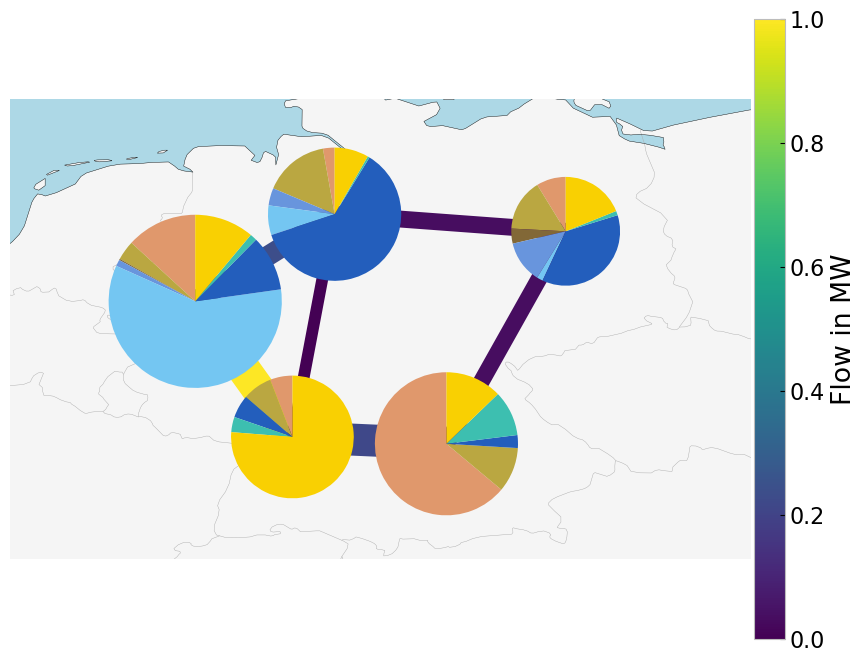

In [123]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

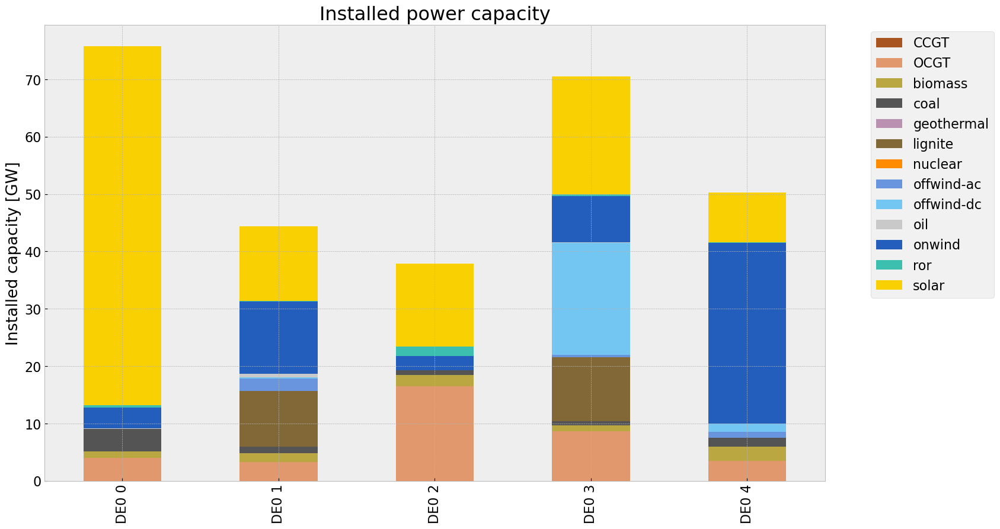

In [124]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

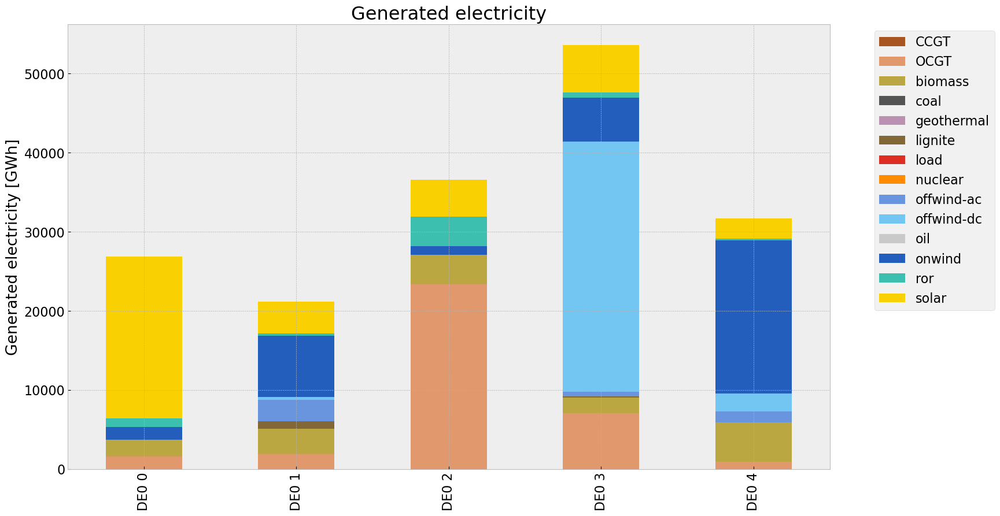

In [125]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [126]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()

#links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\318663498.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\318663498.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [127]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [128]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    #links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    #links = links.drop(columns='DC', inplace=False)
    #links['H2 fuel cell']*=-1
       
    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [129]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [130]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [131]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [132]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, 

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


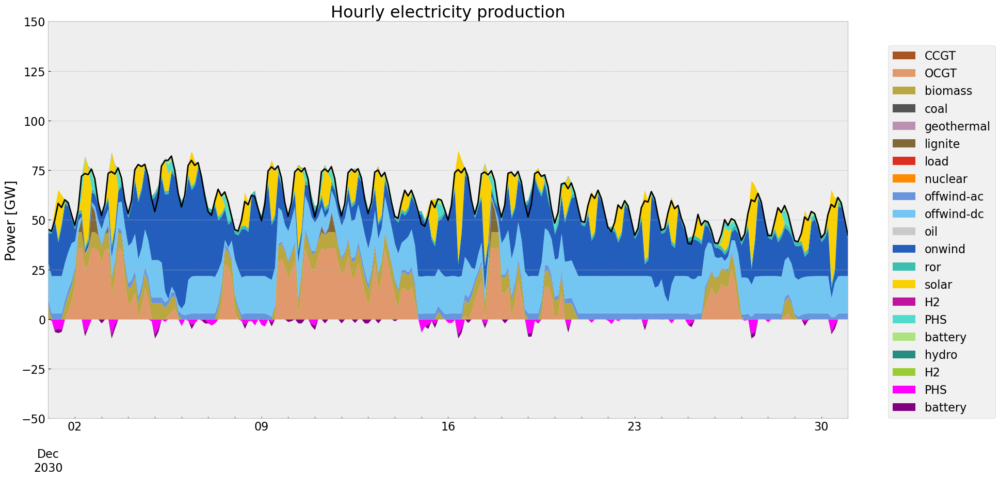

In [133]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, 

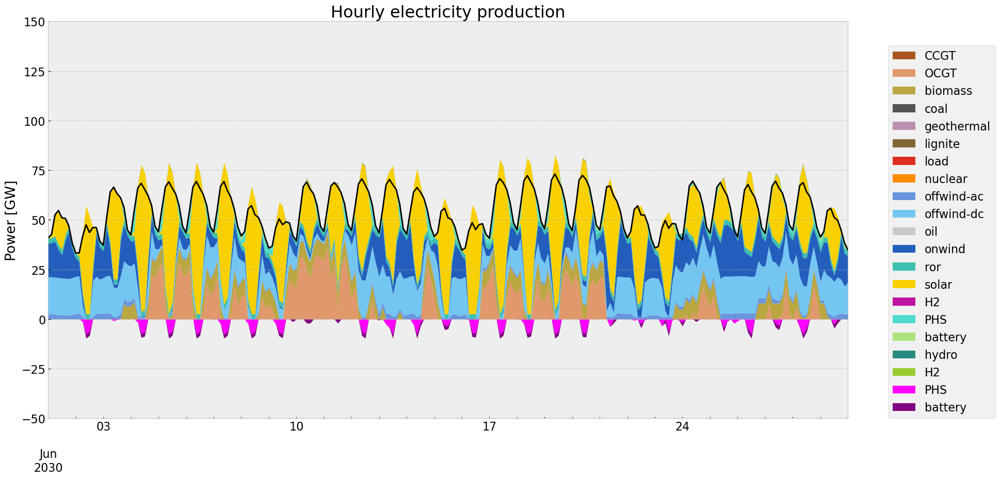

In [134]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [135]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,H2,PHS,battery,hydro
bus,,,,
DE0 0,0.0,2.10300,0.000000,0.1200
DE0 1,0.0,0.99980,0.000000,NaN
DE0 2,0.0,1.85500,0.000000,0.1695
DE0 3,0.0,1.74142,2.054674,NaN
DE0 4,0.0,0.90000,0.000000,NaN


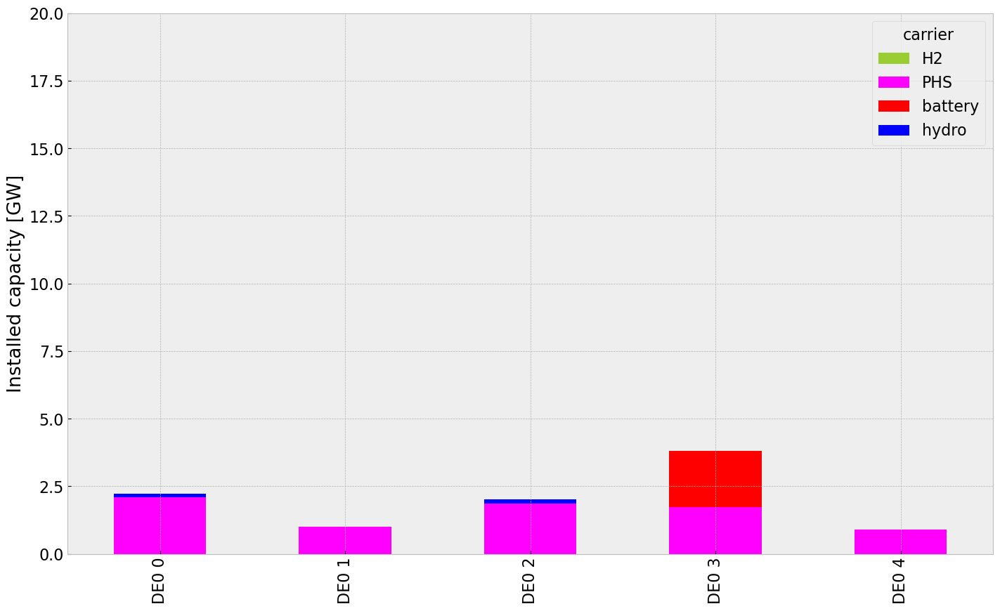

In [136]:
inst_store_table(n)

In [137]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


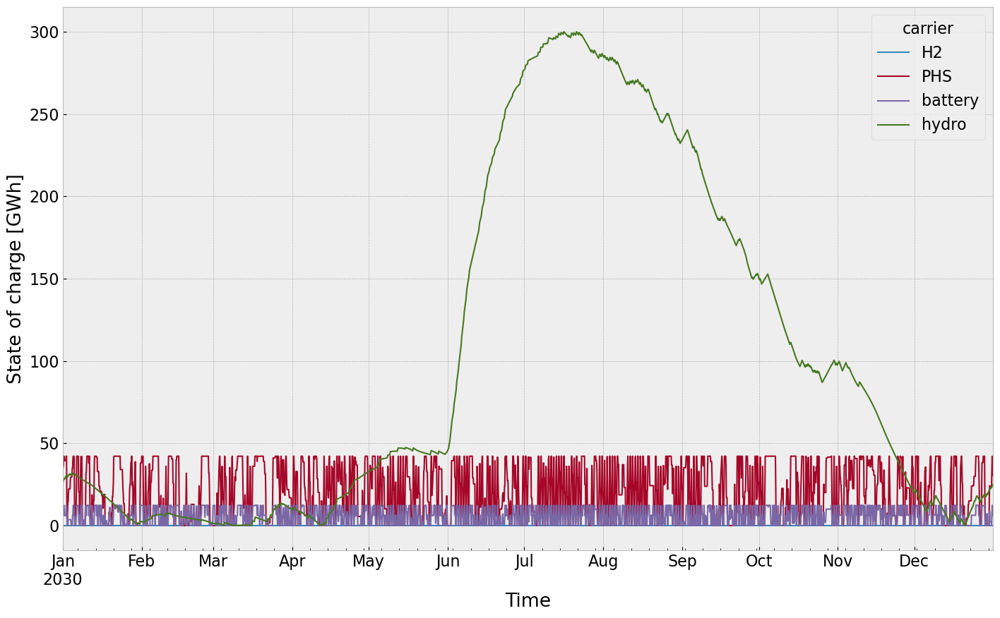

In [138]:
state_of_charge_plot(n)

## Electricity Price

In [139]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [140]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


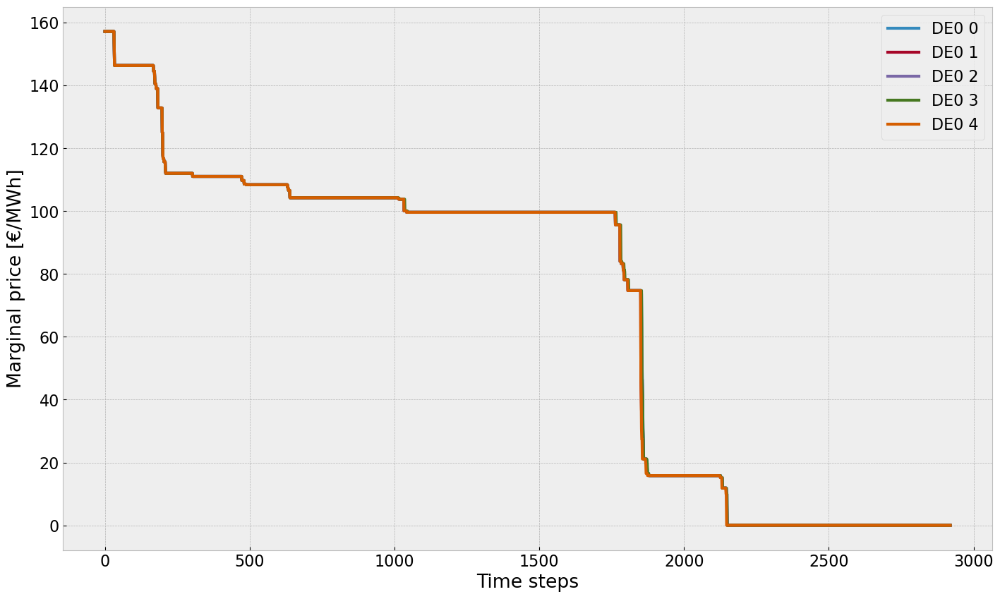

In [141]:
price_dur_curve_plot(n)

In [142]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

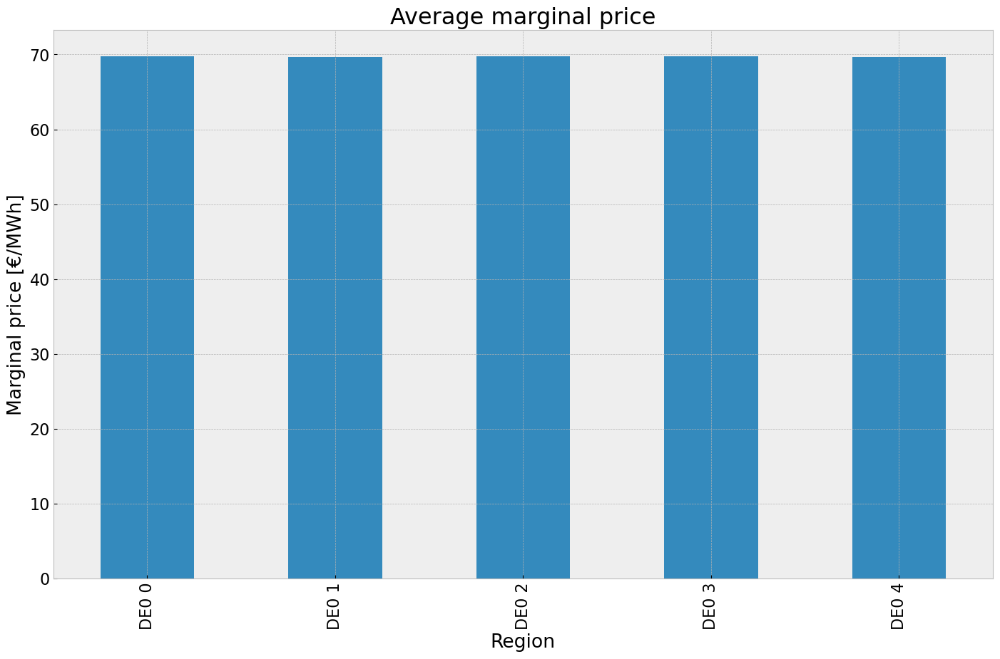

In [143]:
price_regions_table(n)

In [144]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    #hprice = mean_p.filter(like='H2')
    #eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

    # Plot for eprice
    hb= plt.hexbin(
        n.buses.x,
        n.buses.y,
        gridsize=20,
        C=mean_p,
        cmap=plt.cm.jet,
        zorder=3,
    )

    n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    
    cb = fig.colorbar(hb, ax=ax, location='bottom')
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")
    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


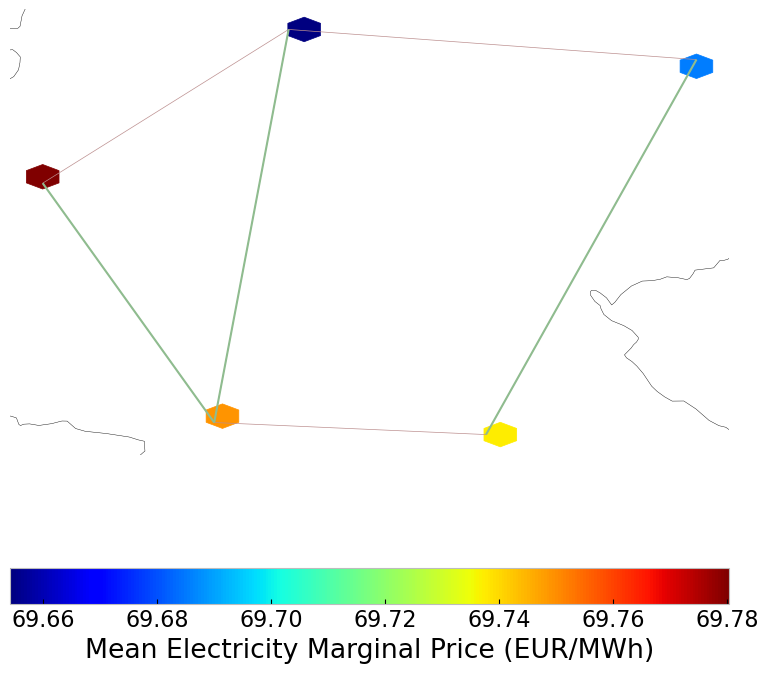

In [145]:
price_regions(n)

## Emission

In [146]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.475453e+07,0.499437,0.1980,1.377831e+07
biomass,1.604494e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.067147e+06,0.358368,0.4069,1.211667e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.633844e+06,1.000000,0.0000,0.000000e+00


# Offwind Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [147]:
#copy network
n1=n.copy()

#p_max_pu of offwind generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [148]:
n1.optimize.create_model()


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-

In [149]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:01<00:00,  7.02it/s]
INFO:linopy.io: Writing time: 10.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4agjluil.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4agjluil.lp


Reading time = 2.98 seconds


INFO:gurobipy:Reading time = 2.98 seconds


obj: 805986 rows, 373779 columns, 1477687 nonzeros


INFO:gurobipy:obj: 805986 rows, 373779 columns, 1477687 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 805986 rows, 373779 columns and 1477687 nonzeros


INFO:gurobipy:Optimize a model with 805986 rows, 373779 columns and 1477687 nonzeros


Model fingerprint: 0xcd046abe


INFO:gurobipy:Model fingerprint: 0xcd046abe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 5e+02]


INFO:gurobipy:  Matrix range     [1e-02, 5e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 565939 rows and 87562 columns


INFO:gurobipy:Presolve removed 565939 rows and 87562 columns


Presolve time: 1.36s


INFO:gurobipy:Presolve time: 1.36s


Presolved: 240047 rows, 286217 columns, 853899 nonzeros


INFO:gurobipy:Presolved: 240047 rows, 286217 columns, 853899 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.38s


INFO:gurobipy:Ordering time: 0.38s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 35


INFO:gurobipy: Dense cols : 35


 AA' NZ     : 8.218e+05


INFO:gurobipy: AA' NZ     : 8.218e+05


 Factor NZ  : 3.955e+06 (roughly 240 MB of memory)


INFO:gurobipy: Factor NZ  : 3.955e+06 (roughly 240 MB of memory)


 Factor Ops : 1.978e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.978e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.35021789e+17 -1.25136221e+18  4.36e+09 4.31e+04  3.59e+13     3s


INFO:gurobipy:   0   1.35021789e+17 -1.25136221e+18  4.36e+09 4.31e+04  3.59e+13     3s


   1   1.24145869e+17 -3.55964274e+17  3.89e+09 1.24e+04  2.21e+13     3s


INFO:gurobipy:   1   1.24145869e+17 -3.55964274e+17  3.89e+09 1.24e+04  2.21e+13     3s


   2   9.66936942e+16 -1.63300047e+17  2.78e+09 4.66e+03  1.46e+13     4s


INFO:gurobipy:   2   9.66936942e+16 -1.63300047e+17  2.78e+09 4.66e+03  1.46e+13     4s


   3   5.54919820e+16 -7.26240124e+16  7.05e+08 1.54e+03  4.07e+12     4s


INFO:gurobipy:   3   5.54919820e+16 -7.26240124e+16  7.05e+08 1.54e+03  4.07e+12     4s


   4   4.21439992e+16 -8.65237306e+15  3.37e+08 1.61e+02  1.67e+12     5s


INFO:gurobipy:   4   4.21439992e+16 -8.65237306e+15  3.37e+08 1.61e+02  1.67e+12     5s


   5   9.26805578e+15 -2.26630593e+15  4.53e+07 3.89e+01  2.39e+11     5s


INFO:gurobipy:   5   9.26805578e+15 -2.26630593e+15  4.53e+07 3.89e+01  2.39e+11     5s


   6   1.62062759e+15 -1.84471946e+14  2.34e+05 1.89e+00  4.49e+09     5s


INFO:gurobipy:   6   1.62062759e+15 -1.84471946e+14  2.34e+05 1.89e+00  4.49e+09     5s


   7   9.39360300e+14 -4.67757680e+13  1.32e+05 2.02e-03  2.18e+09     6s


INFO:gurobipy:   7   9.39360300e+14 -4.67757680e+13  1.32e+05 2.02e-03  2.18e+09     6s


   8   1.59637147e+14 -3.42544955e+13  2.02e+04 6.18e-06  4.04e+08     6s


INFO:gurobipy:   8   1.59637147e+14 -3.42544955e+13  2.02e+04 6.18e-06  4.04e+08     6s


   9   6.96896408e+13 -1.34113653e+13  8.57e+03 5.27e-07  1.64e+08     6s


INFO:gurobipy:   9   6.96896408e+13 -1.34113653e+13  8.57e+03 5.27e-07  1.64e+08     6s


  10   2.20078441e+12 -3.17982282e+12  2.54e+02 1.58e-07  9.32e+06     7s


INFO:gurobipy:  10   2.20078441e+12 -3.17982282e+12  2.54e+02 1.58e-07  9.32e+06     7s


  11   1.06861824e+12 -1.21360840e+12  1.16e+02 5.74e-08  3.87e+06     7s


INFO:gurobipy:  11   1.06861824e+12 -1.21360840e+12  1.16e+02 5.74e-08  3.87e+06     7s


  12   5.52377173e+11 -8.16296336e+11  4.98e+01 3.88e-08  2.29e+06     8s


INFO:gurobipy:  12   5.52377173e+11 -8.16296336e+11  4.98e+01 3.88e-08  2.29e+06     8s


  13   3.53753426e+11 -6.60674077e+11  2.86e+01 3.17e-08  1.69e+06     8s


INFO:gurobipy:  13   3.53753426e+11 -6.60674077e+11  2.86e+01 3.17e-08  1.69e+06     8s


  14   2.53435264e+11 -6.43569204e+11  1.94e+01 3.10e-08  1.49e+06     8s


INFO:gurobipy:  14   2.53435264e+11 -6.43569204e+11  1.94e+01 3.10e-08  1.49e+06     8s


  15   1.49068713e+11 -2.47275136e+11  9.77e+00 1.24e-08  6.57e+05     9s


INFO:gurobipy:  15   1.49068713e+11 -2.47275136e+11  9.77e+00 1.24e-08  6.57e+05     9s


  16   8.63399180e+10 -8.91897660e+10  4.16e+00 4.66e-09  2.90e+05     9s


INFO:gurobipy:  16   8.63399180e+10 -8.91897660e+10  4.16e+00 4.66e-09  2.90e+05     9s


  17   6.70051535e+10 -4.03885777e+10  2.67e+00 2.92e-09  1.78e+05    10s


INFO:gurobipy:  17   6.70051535e+10 -4.03885777e+10  2.67e+00 2.92e-09  1.78e+05    10s


  18   5.44602203e+10 -1.63095971e+10  1.73e+00 1.78e-09  1.17e+05    10s


INFO:gurobipy:  18   5.44602203e+10 -1.63095971e+10  1.73e+00 1.78e-09  1.17e+05    10s


  19   5.33645015e+10 -1.27960395e+10  1.65e+00 1.76e-09  1.09e+05    11s


INFO:gurobipy:  19   5.33645015e+10 -1.27960395e+10  1.65e+00 1.76e-09  1.09e+05    11s


  20   4.63469916e+10 -2.30011858e+08  1.13e+00 1.56e-09  7.70e+04    11s


INFO:gurobipy:  20   4.63469916e+10 -2.30011858e+08  1.13e+00 1.56e-09  7.70e+04    11s


  21   4.29089293e+10  7.93018961e+09  9.02e-01 8.25e-10  5.78e+04    11s


INFO:gurobipy:  21   4.29089293e+10  7.93018961e+09  9.02e-01 8.25e-10  5.78e+04    11s


  22   3.85123388e+10  1.41444099e+10  6.09e-01 7.16e-10  4.03e+04    12s


INFO:gurobipy:  22   3.85123388e+10  1.41444099e+10  6.09e-01 7.16e-10  4.03e+04    12s


  23   3.55413453e+10  1.88771768e+10  4.17e-01 4.73e-10  2.75e+04    12s


INFO:gurobipy:  23   3.55413453e+10  1.88771768e+10  4.17e-01 4.73e-10  2.75e+04    12s


  24   3.31230109e+10  2.21385966e+10  2.69e-01 4.59e-10  1.82e+04    12s


INFO:gurobipy:  24   3.31230109e+10  2.21385966e+10  2.69e-01 4.59e-10  1.82e+04    12s


  25   3.13434392e+10  2.37817697e+10  1.63e-01 3.77e-10  1.25e+04    13s


INFO:gurobipy:  25   3.13434392e+10  2.37817697e+10  1.63e-01 3.77e-10  1.25e+04    13s


  26   3.04219295e+10  2.48087085e+10  1.13e-01 5.46e-10  9.28e+03    13s


INFO:gurobipy:  26   3.04219295e+10  2.48087085e+10  1.13e-01 5.46e-10  9.28e+03    13s


  27   2.99644842e+10  2.55982894e+10  8.86e-02 2.63e-10  7.22e+03    14s


INFO:gurobipy:  27   2.99644842e+10  2.55982894e+10  8.86e-02 2.63e-10  7.22e+03    14s


  28   2.97553324e+10  2.57991785e+10  7.75e-02 1.59e-10  6.54e+03    14s


INFO:gurobipy:  28   2.97553324e+10  2.57991785e+10  7.75e-02 1.59e-10  6.54e+03    14s


  29   2.92323266e+10  2.62498285e+10  5.08e-02 2.35e-10  4.93e+03    15s


INFO:gurobipy:  29   2.92323266e+10  2.62498285e+10  5.08e-02 2.35e-10  4.93e+03    15s


  30   2.90013825e+10  2.66702882e+10  3.96e-02 2.02e-10  3.85e+03    16s


INFO:gurobipy:  30   2.90013825e+10  2.66702882e+10  3.96e-02 2.02e-10  3.85e+03    16s


  31   2.87595452e+10  2.71408965e+10  2.81e-02 9.42e-10  2.67e+03    16s


INFO:gurobipy:  31   2.87595452e+10  2.71408965e+10  2.81e-02 9.42e-10  2.67e+03    16s


  32   2.86298316e+10  2.73951450e+10  2.20e-02 2.87e-10  2.04e+03    17s


INFO:gurobipy:  32   2.86298316e+10  2.73951450e+10  2.20e-02 2.87e-10  2.04e+03    17s


  33   2.85289940e+10  2.75861316e+10  1.75e-02 2.12e-10  1.56e+03    17s


INFO:gurobipy:  33   2.85289940e+10  2.75861316e+10  1.75e-02 2.12e-10  1.56e+03    17s


  34   2.84686481e+10  2.76299126e+10  1.49e-02 5.67e-10  1.39e+03    17s


INFO:gurobipy:  34   2.84686481e+10  2.76299126e+10  1.49e-02 5.67e-10  1.39e+03    17s


  35   2.84108208e+10  2.76756602e+10  1.24e-02 5.67e-10  1.21e+03    18s


INFO:gurobipy:  35   2.84108208e+10  2.76756602e+10  1.24e-02 5.67e-10  1.21e+03    18s


  36   2.83905999e+10  2.77585774e+10  1.15e-02 2.03e-10  1.04e+03    19s


INFO:gurobipy:  36   2.83905999e+10  2.77585774e+10  1.15e-02 2.03e-10  1.04e+03    19s


  37   2.83122078e+10  2.78316939e+10  8.16e-03 4.78e-10  7.94e+02    19s


INFO:gurobipy:  37   2.83122078e+10  2.78316939e+10  8.16e-03 4.78e-10  7.94e+02    19s


  38   2.82673552e+10  2.78541244e+10  6.22e-03 4.12e-10  6.83e+02    20s


INFO:gurobipy:  38   2.82673552e+10  2.78541244e+10  6.22e-03 4.12e-10  6.83e+02    20s


  39   2.82391594e+10  2.79252403e+10  4.99e-03 2.87e-10  5.19e+02    20s


INFO:gurobipy:  39   2.82391594e+10  2.79252403e+10  4.99e-03 2.87e-10  5.19e+02    20s


  40   2.82059114e+10  2.79837229e+10  3.55e-03 4.22e-10  3.67e+02    21s


INFO:gurobipy:  40   2.82059114e+10  2.79837229e+10  3.55e-03 4.22e-10  3.67e+02    21s


  41   2.81923694e+10  2.80073294e+10  2.99e-03 3.42e-10  3.06e+02    21s


INFO:gurobipy:  41   2.81923694e+10  2.80073294e+10  2.99e-03 3.42e-10  3.06e+02    21s


  42   2.81695228e+10  2.80164807e+10  2.03e-03 7.00e-11  2.53e+02    22s


INFO:gurobipy:  42   2.81695228e+10  2.80164807e+10  2.03e-03 7.00e-11  2.53e+02    22s


  43   2.81568559e+10  2.80317470e+10  1.48e-03 2.23e-10  2.07e+02    22s


INFO:gurobipy:  43   2.81568559e+10  2.80317470e+10  1.48e-03 2.23e-10  2.07e+02    22s


  44   2.81462416e+10  2.80561923e+10  1.02e-03 6.92e-10  1.49e+02    23s


INFO:gurobipy:  44   2.81462416e+10  2.80561923e+10  1.02e-03 6.92e-10  1.49e+02    23s


  45   2.81411458e+10  2.80723416e+10  8.18e-04 2.23e-10  1.14e+02    23s


INFO:gurobipy:  45   2.81411458e+10  2.80723416e+10  8.18e-04 2.23e-10  1.14e+02    23s


  46   2.81380400e+10  2.80817443e+10  6.93e-04 6.51e-10  9.30e+01    24s


INFO:gurobipy:  46   2.81380400e+10  2.80817443e+10  6.93e-04 6.51e-10  9.30e+01    24s


  47   2.81325262e+10  2.80885404e+10  4.74e-04 4.22e-10  7.27e+01    24s


INFO:gurobipy:  47   2.81325262e+10  2.80885404e+10  4.74e-04 4.22e-10  7.27e+01    24s


  48   2.81282000e+10  2.80950255e+10  2.94e-04 6.58e-10  5.48e+01    25s


INFO:gurobipy:  48   2.81282000e+10  2.80950255e+10  2.94e-04 6.58e-10  5.48e+01    25s


  49   2.81258190e+10  2.81021788e+10  1.98e-04 3.70e-10  3.91e+01    25s


INFO:gurobipy:  49   2.81258190e+10  2.81021788e+10  1.98e-04 3.70e-10  3.91e+01    25s


  50   2.81247807e+10  2.81065628e+10  1.57e-04 2.60e-10  3.01e+01    25s


INFO:gurobipy:  50   2.81247807e+10  2.81065628e+10  1.57e-04 2.60e-10  3.01e+01    25s


  51   2.81241791e+10  2.81079047e+10  1.35e-04 3.82e-10  2.69e+01    26s


INFO:gurobipy:  51   2.81241791e+10  2.81079047e+10  1.35e-04 3.82e-10  2.69e+01    26s


  52   2.81235151e+10  2.81108939e+10  1.11e-04 3.96e-10  2.09e+01    26s


INFO:gurobipy:  52   2.81235151e+10  2.81108939e+10  1.11e-04 3.96e-10  2.09e+01    26s


  53   2.81224242e+10  2.81130484e+10  7.10e-05 4.09e-10  1.55e+01    27s


INFO:gurobipy:  53   2.81224242e+10  2.81130484e+10  7.10e-05 4.09e-10  1.55e+01    27s


  54   2.81221086e+10  2.81137657e+10  6.00e-05 5.08e-10  1.38e+01    27s


INFO:gurobipy:  54   2.81221086e+10  2.81137657e+10  6.00e-05 5.08e-10  1.38e+01    27s


  55   2.81217036e+10  2.81143322e+10  4.59e-05 2.06e-10  1.22e+01    28s


INFO:gurobipy:  55   2.81217036e+10  2.81143322e+10  4.59e-05 2.06e-10  1.22e+01    28s


  56   2.81214148e+10  2.81170079e+10  3.60e-05 5.26e-10  7.28e+00    28s


INFO:gurobipy:  56   2.81214148e+10  2.81170079e+10  3.60e-05 5.26e-10  7.28e+00    28s


  57   2.81212801e+10  2.81173284e+10  3.16e-05 3.09e-10  6.53e+00    29s


INFO:gurobipy:  57   2.81212801e+10  2.81173284e+10  3.16e-05 3.09e-10  6.53e+00    29s


  58   2.81211400e+10  2.81175324e+10  2.71e-05 5.63e-10  5.96e+00    29s


INFO:gurobipy:  58   2.81211400e+10  2.81175324e+10  2.71e-05 5.63e-10  5.96e+00    29s


  59   2.81209935e+10  2.81187415e+10  2.23e-05 2.76e-10  3.72e+00    30s


INFO:gurobipy:  59   2.81209935e+10  2.81187415e+10  2.23e-05 2.76e-10  3.72e+00    30s


  60   2.81208482e+10  2.81188673e+10  2.06e-05 3.08e-10  3.27e+00    31s


INFO:gurobipy:  60   2.81208482e+10  2.81188673e+10  2.06e-05 3.08e-10  3.27e+00    31s


  61   2.81207612e+10  2.81192113e+10  1.85e-05 2.51e-10  2.56e+00    31s


INFO:gurobipy:  61   2.81207612e+10  2.81192113e+10  1.85e-05 2.51e-10  2.56e+00    31s


  62   2.81207311e+10  2.81194407e+10  1.75e-05 5.14e-10  2.13e+00    32s


INFO:gurobipy:  62   2.81207311e+10  2.81194407e+10  1.75e-05 5.14e-10  2.13e+00    32s


  63   2.81206862e+10  2.81194568e+10  1.70e-05 3.53e-10  2.03e+00    32s


INFO:gurobipy:  63   2.81206862e+10  2.81194568e+10  1.70e-05 3.53e-10  2.03e+00    32s


  64   2.81206186e+10  2.81195510e+10  1.52e-05 2.98e-10  1.76e+00    33s


INFO:gurobipy:  64   2.81206186e+10  2.81195510e+10  1.52e-05 2.98e-10  1.76e+00    33s


  65   2.81205353e+10  2.81196185e+10  1.08e-05 3.67e-10  1.51e+00    34s


INFO:gurobipy:  65   2.81205353e+10  2.81196185e+10  1.08e-05 3.67e-10  1.51e+00    34s


  66   2.81205079e+10  2.81197910e+10  9.73e-06 4.15e-10  1.18e+00    34s


INFO:gurobipy:  66   2.81205079e+10  2.81197910e+10  9.73e-06 4.15e-10  1.18e+00    34s


  67   2.81204876e+10  2.81198496e+10  8.89e-06 1.42e-10  1.05e+00    37s


INFO:gurobipy:  67   2.81204876e+10  2.81198496e+10  8.89e-06 1.42e-10  1.05e+00    37s


  68   2.81204080e+10  2.81199502e+10  5.90e-06 6.95e-10  7.57e-01    38s


INFO:gurobipy:  68   2.81204080e+10  2.81199502e+10  5.90e-06 6.95e-10  7.57e-01    38s


  69   2.81203931e+10  2.81200074e+10  5.32e-06 3.23e-10  6.37e-01    39s


INFO:gurobipy:  69   2.81203931e+10  2.81200074e+10  5.32e-06 3.23e-10  6.37e-01    39s


  70   2.81203509e+10  2.81200567e+10  3.79e-06 4.85e-10  4.86e-01    40s


INFO:gurobipy:  70   2.81203509e+10  2.81200567e+10  3.79e-06 4.85e-10  4.86e-01    40s


  71   2.81203297e+10  2.81201307e+10  3.01e-06 1.65e-10  3.29e-01    41s


INFO:gurobipy:  71   2.81203297e+10  2.81201307e+10  3.01e-06 1.65e-10  3.29e-01    41s


  72   2.81202917e+10  2.81201589e+10  2.14e-06 1.33e-10  2.19e-01    41s


INFO:gurobipy:  72   2.81202917e+10  2.81201589e+10  2.14e-06 1.33e-10  2.19e-01    41s


  73   2.81202648e+10  2.81201776e+10  2.50e-06 6.04e-10  1.44e-01    42s


INFO:gurobipy:  73   2.81202648e+10  2.81201776e+10  2.50e-06 6.04e-10  1.44e-01    42s


  74   2.81202599e+10  2.81202002e+10  1.90e-06 1.53e-10  9.87e-02    43s


INFO:gurobipy:  74   2.81202599e+10  2.81202002e+10  1.90e-06 1.53e-10  9.87e-02    43s


  75   2.81202533e+10  2.81202014e+10  1.16e-06 5.75e-10  8.58e-02    43s


INFO:gurobipy:  75   2.81202533e+10  2.81202014e+10  1.16e-06 5.75e-10  8.58e-02    43s


  76   2.81202505e+10  2.81202201e+10  8.23e-07 1.50e-10  5.03e-02    44s


INFO:gurobipy:  76   2.81202505e+10  2.81202201e+10  8.23e-07 1.50e-10  5.03e-02    44s


  77   2.81202483e+10  2.81202269e+10  5.72e-07 2.17e-10  3.54e-02    44s


INFO:gurobipy:  77   2.81202483e+10  2.81202269e+10  5.72e-07 2.17e-10  3.54e-02    44s


  78   2.81202468e+10  2.81202308e+10  3.95e-07 2.89e-10  2.64e-02    44s


INFO:gurobipy:  78   2.81202468e+10  2.81202308e+10  3.95e-07 2.89e-10  2.64e-02    44s


  79   2.81202451e+10  2.81202341e+10  2.21e-07 2.15e-10  1.81e-02    45s


INFO:gurobipy:  79   2.81202451e+10  2.81202341e+10  2.21e-07 2.15e-10  1.81e-02    45s


  80   2.81202442e+10  2.81202359e+10  1.27e-07 3.09e-10  1.37e-02    45s


INFO:gurobipy:  80   2.81202442e+10  2.81202359e+10  1.27e-07 3.09e-10  1.37e-02    45s


  81   2.81202437e+10  2.81202388e+10  7.00e-08 4.29e-10  8.04e-03    46s


INFO:gurobipy:  81   2.81202437e+10  2.81202388e+10  7.00e-08 4.29e-10  8.04e-03    46s


  82   2.81202434e+10  2.81202404e+10  4.51e-08 1.93e-10  4.88e-03    46s


INFO:gurobipy:  82   2.81202434e+10  2.81202404e+10  4.51e-08 1.93e-10  4.88e-03    46s


  83   2.81202433e+10  2.81202413e+10  6.90e-08 1.84e-10  3.24e-03    47s


INFO:gurobipy:  83   2.81202433e+10  2.81202413e+10  6.90e-08 1.84e-10  3.24e-03    47s


  84   2.81202431e+10  2.81202418e+10  3.06e-05 1.72e-09  2.11e-03    47s


INFO:gurobipy:  84   2.81202431e+10  2.81202418e+10  3.06e-05 1.72e-09  2.11e-03    47s


  85   2.81202431e+10  2.81202421e+10  2.44e-05 1.53e-09  1.57e-03    48s


INFO:gurobipy:  85   2.81202431e+10  2.81202421e+10  2.44e-05 1.53e-09  1.57e-03    48s


  86   2.81202430e+10  2.81202423e+10  2.15e-05 1.29e-09  1.21e-03    48s


INFO:gurobipy:  86   2.81202430e+10  2.81202423e+10  2.15e-05 1.29e-09  1.21e-03    48s


  87   2.81202429e+10  2.81202425e+10  9.59e-06 2.39e-09  7.02e-04    48s


INFO:gurobipy:  87   2.81202429e+10  2.81202425e+10  9.59e-06 2.39e-09  7.02e-04    48s


  88   2.81202428e+10  2.81202427e+10  2.41e-05 1.89e-09  2.80e-04    49s


INFO:gurobipy:  88   2.81202428e+10  2.81202427e+10  2.41e-05 1.89e-09  2.80e-04    49s


  89   2.81202428e+10  2.81202428e+10  1.21e-05 1.26e-09  1.02e-04    49s


INFO:gurobipy:  89   2.81202428e+10  2.81202428e+10  1.21e-05 1.26e-09  1.02e-04    49s


  90   2.81202428e+10  2.81202428e+10  1.01e-05 8.83e-10  4.11e-05    49s


INFO:gurobipy:  90   2.81202428e+10  2.81202428e+10  1.01e-05 8.83e-10  4.11e-05    49s


  91   2.81202428e+10  2.81202428e+10  6.27e-06 5.04e-10  7.57e-06    50s


INFO:gurobipy:  91   2.81202428e+10  2.81202428e+10  6.27e-06 5.04e-10  7.57e-06    50s


  92   2.81202428e+10  2.81202428e+10  1.48e-06 2.02e-09  1.15e-06    50s


INFO:gurobipy:  92   2.81202428e+10  2.81202428e+10  1.48e-06 2.02e-09  1.15e-06    50s


  93   2.81202428e+10  2.81202428e+10  8.73e-07 1.13e-08  7.17e-08    51s


INFO:gurobipy:  93   2.81202428e+10  2.81202428e+10  8.73e-07 1.13e-08  7.17e-08    51s


  94   2.81202428e+10  2.81202428e+10  4.33e-10 2.60e-09  6.30e-12    51s


INFO:gurobipy:  94   2.81202428e+10  2.81202428e+10  4.33e-10 2.60e-09  6.30e-12    51s


INFO:gurobipy:


Barrier solved model in 94 iterations and 50.99 seconds (15.34 work units)


INFO:gurobipy:Barrier solved model in 94 iterations and 50.99 seconds (15.34 work units)


Optimal objective 2.81202428e+10


INFO:gurobipy:Optimal objective 2.81202428e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   96507 DPushes remaining with DInf 0.0000000e+00                52s


INFO:gurobipy:   96507 DPushes remaining with DInf 0.0000000e+00                52s


   15403 DPushes remaining with DInf 0.0000000e+00                56s


INFO:gurobipy:   15403 DPushes remaining with DInf 0.0000000e+00                56s


       0 DPushes remaining with DInf 0.0000000e+00                56s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                56s


INFO:gurobipy:


    9097 PPushes remaining with PInf 0.0000000e+00                57s


INFO:gurobipy:    9097 PPushes remaining with PInf 0.0000000e+00                57s


       0 PPushes remaining with PInf 0.0000000e+00                58s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                58s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9662452e-09     58s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9662452e-09     58s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   62005    2.8120243e+10   0.000000e+00   0.000000e+00     59s


INFO:gurobipy:   62005    2.8120243e+10   0.000000e+00   0.000000e+00     59s


INFO:gurobipy:


Solved in 62005 iterations and 58.84 seconds (19.93 work units)


INFO:gurobipy:Solved in 62005 iterations and 58.84 seconds (19.93 work units)


Optimal objective  2.812024279e+10


INFO:gurobipy:Optimal objective  2.812024279e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 373779 primals, 805986 duals
Objective: 2.81e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [150]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

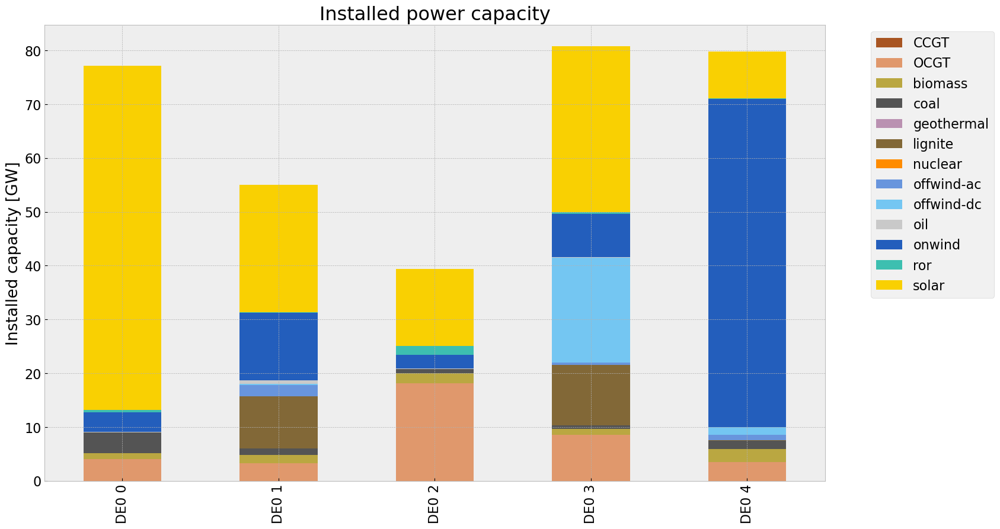

In [151]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

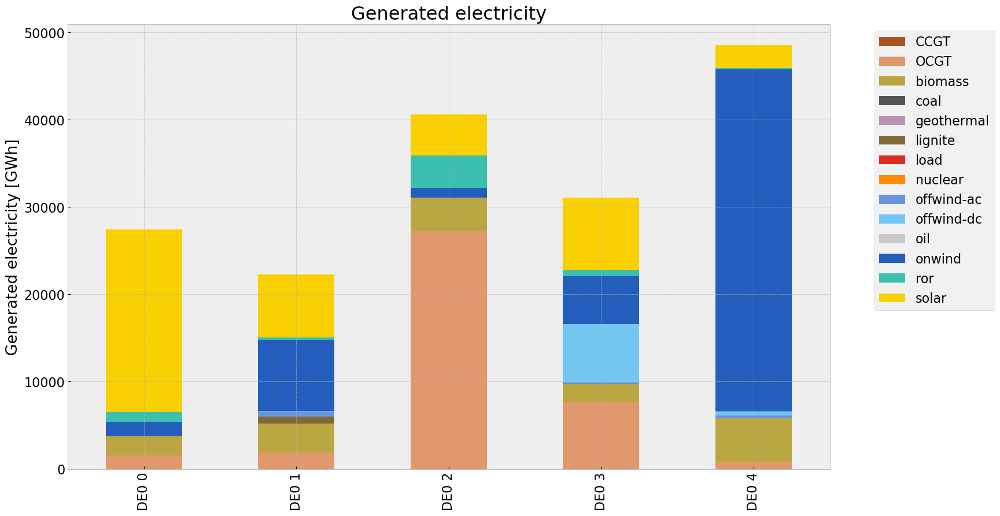

In [152]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)

## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, 

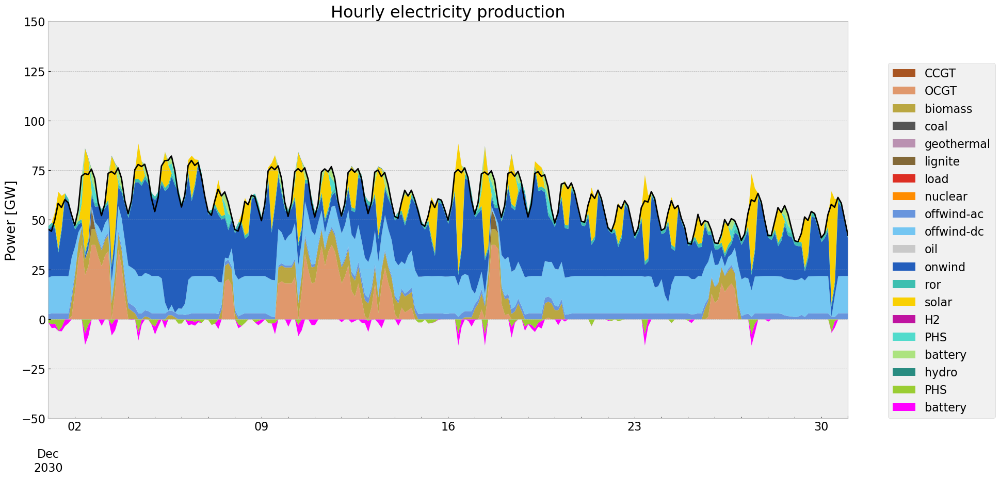

In [153]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, 

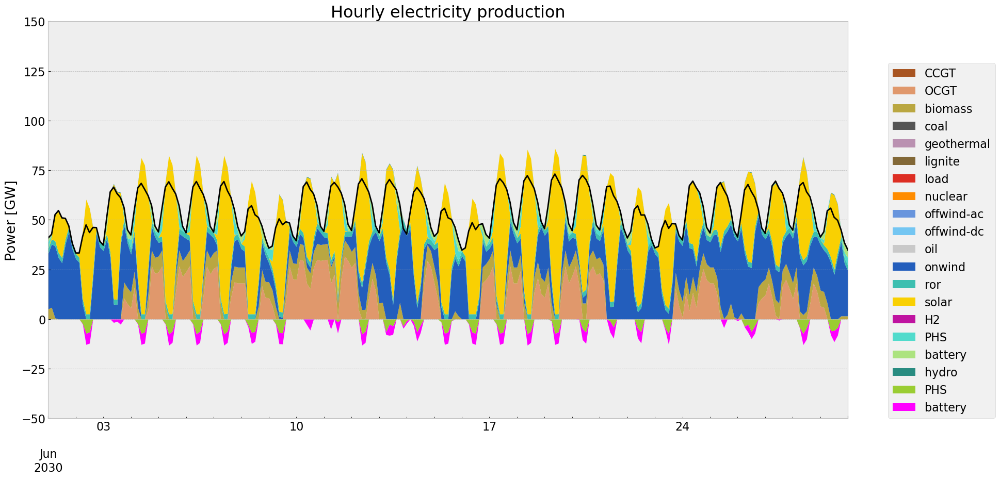

In [154]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen)

## Storage

carrier,H2,PHS,battery,hydro
bus,,,,
DE0 0,0.0,2.10300,1.849853,0.1200
DE0 1,0.0,0.99980,0.000000,NaN
DE0 2,0.0,1.85500,0.000000,0.1695
DE0 3,0.0,1.74142,2.054674,NaN
DE0 4,0.0,0.90000,1.686117,NaN


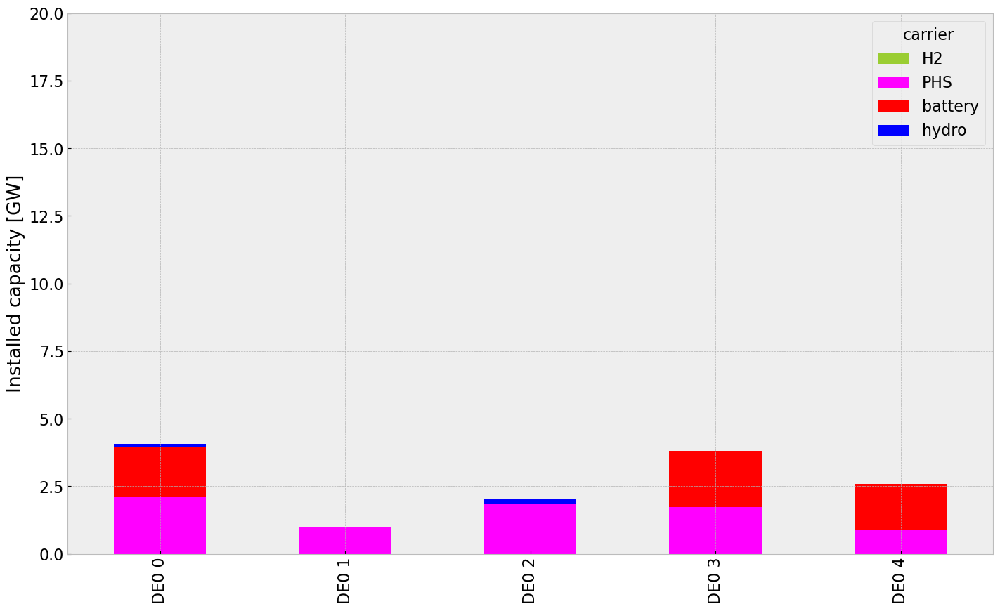

In [155]:
inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


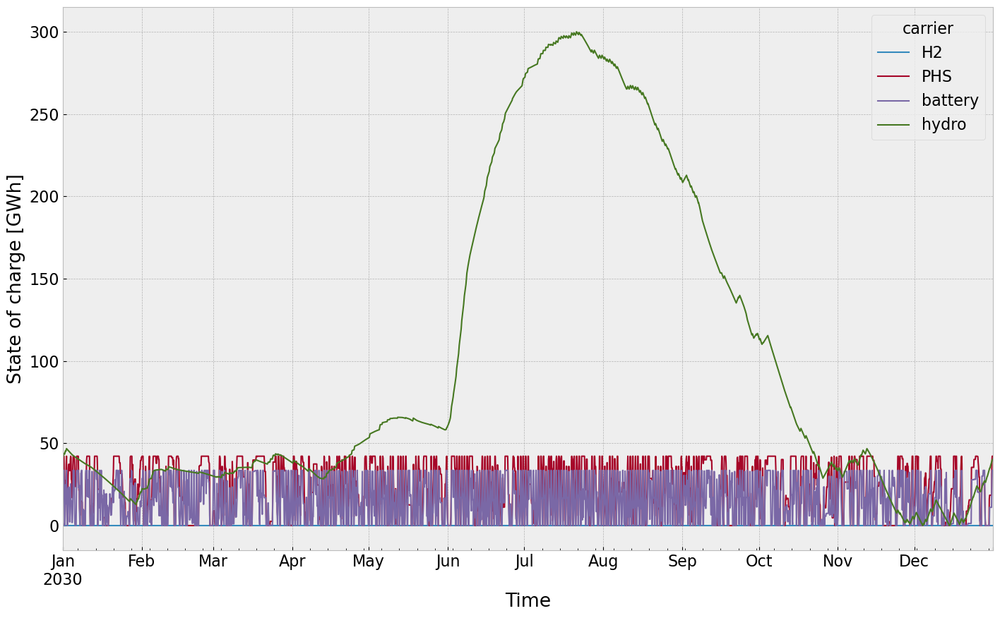

In [156]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


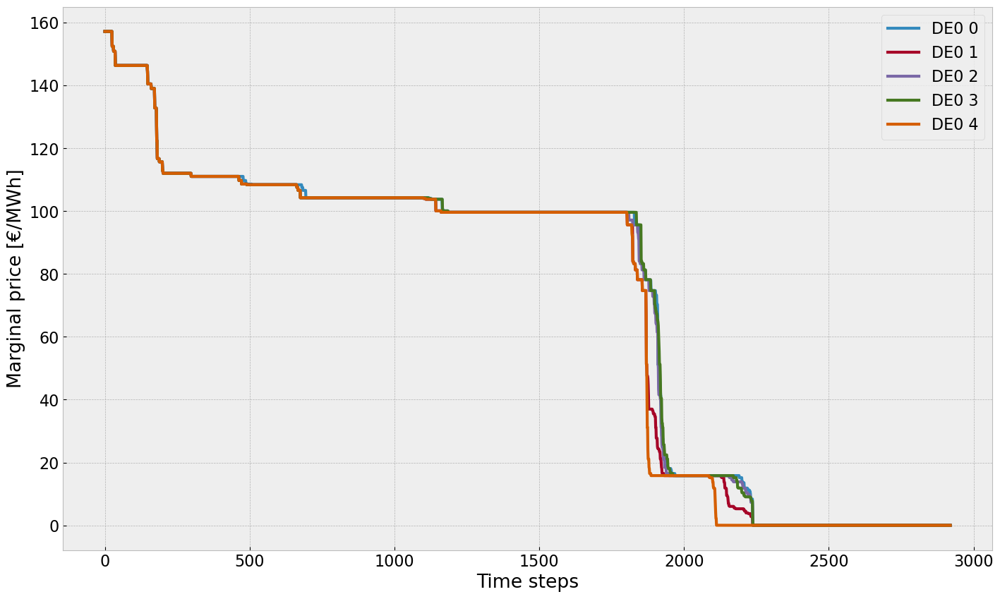

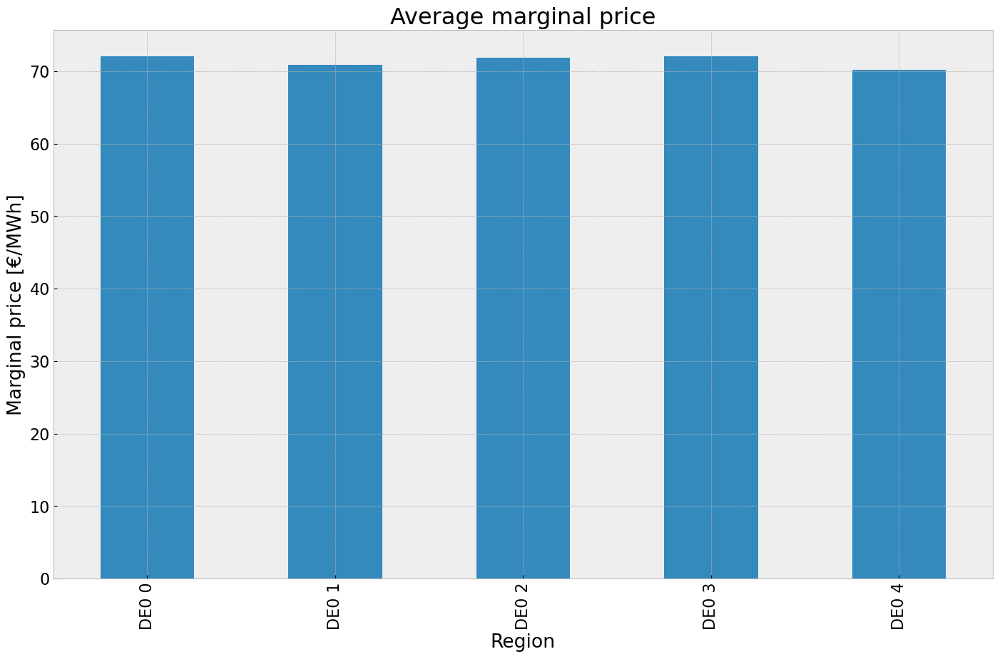

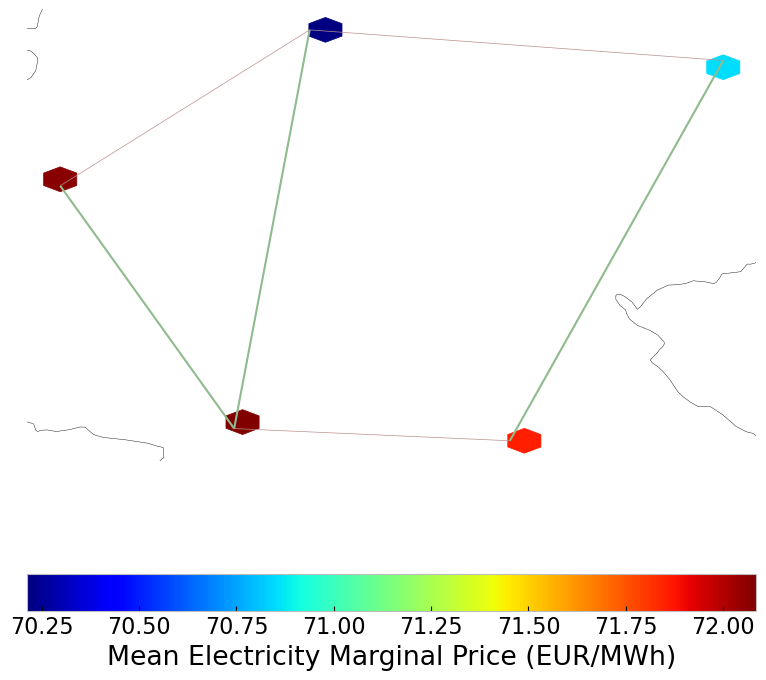

In [157]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [158]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.923444e+07,0.499437,0.1980,1.555436e+07
biomass,1.633369e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,8.786689e+05,0.358368,0.4069,9.976639e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.023135e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [159]:
#copy network
n2=n.copy()

#offwind cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('offwind-ac') or column.endswith('offwind-dc'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index < cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n2.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [160]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-state_of_charge-

In [161]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:01<00:00,  5.60it/s]
INFO:linopy.io: Writing time: 9.18s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_f_jl51z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_f_jl51z.lp


Reading time = 3.08 seconds


INFO:gurobipy:Reading time = 3.08 seconds


obj: 805927 rows, 373741 columns, 1316907 nonzeros


INFO:gurobipy:obj: 805927 rows, 373741 columns, 1316907 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 805927 rows, 373741 columns and 1316907 nonzeros


INFO:gurobipy:Optimize a model with 805927 rows, 373741 columns and 1316907 nonzeros


Model fingerprint: 0xbbef7af4


INFO:gurobipy:Model fingerprint: 0xbbef7af4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+01, 5e+02]


INFO:gurobipy:  Bounds range     [1e+01, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 744623 rows and 160550 columns


INFO:gurobipy:Presolve removed 744623 rows and 160550 columns


Presolve time: 0.83s


INFO:gurobipy:Presolve time: 0.83s


Presolved: 61304 rows, 213191 columns, 359172 nonzeros


INFO:gurobipy:Presolved: 61304 rows, 213191 columns, 359172 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 3


INFO:gurobipy: Dense cols : 3


 AA' NZ     : 1.489e+05


INFO:gurobipy: AA' NZ     : 1.489e+05


 Factor NZ  : 1.008e+06 (roughly 120 MB of memory)


INFO:gurobipy: Factor NZ  : 1.008e+06 (roughly 120 MB of memory)


 Factor Ops : 1.984e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.984e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.29983260e+12 -4.42275680e+13  3.05e+05 1.38e+04  8.65e+08     1s


INFO:gurobipy:   0   7.29983260e+12 -4.42275680e+13  3.05e+05 1.38e+04  8.65e+08     1s


   1   2.84897921e+12 -2.07184249e+13  4.40e+04 2.18e+03  1.48e+08     1s


INFO:gurobipy:   1   2.84897921e+12 -2.07184249e+13  4.40e+04 2.18e+03  1.48e+08     1s


   2   2.33807435e+12 -8.04143772e+12  3.53e+04 6.59e+01  7.71e+07     1s


INFO:gurobipy:   2   2.33807435e+12 -8.04143772e+12  3.53e+04 6.59e+01  7.71e+07     1s


   3   3.36428096e+11 -3.08228372e+12  6.87e+02 7.20e+00  8.75e+06     2s


INFO:gurobipy:   3   3.36428096e+11 -3.08228372e+12  6.87e+02 7.20e+00  8.75e+06     2s


   4   5.97863839e+10 -3.84653934e+11  3.93e+01 6.88e-01  1.05e+06     2s


INFO:gurobipy:   4   5.97863839e+10 -3.84653934e+11  3.93e+01 6.88e-01  1.05e+06     2s


   5   4.19400323e+10 -2.09901104e+11  1.01e+01 3.90e-01  5.93e+05     2s


INFO:gurobipy:   5   4.19400323e+10 -2.09901104e+11  1.01e+01 3.90e-01  5.93e+05     2s


   6   3.77390423e+10 -1.81600976e+11  5.92e+00 3.36e-01  5.16e+05     2s


INFO:gurobipy:   6   3.77390423e+10 -1.81600976e+11  5.92e+00 3.36e-01  5.16e+05     2s


   7   3.10843683e+10 -2.75685542e+10  1.26e+00 7.43e-02  1.38e+05     2s


INFO:gurobipy:   7   3.10843683e+10 -2.75685542e+10  1.26e+00 7.43e-02  1.38e+05     2s


   8   2.60426174e+10  4.07800356e+09  4.19e-01 2.39e-02  5.15e+04     2s


INFO:gurobipy:   8   2.60426174e+10  4.07800356e+09  4.19e-01 2.39e-02  5.15e+04     2s


   9   2.18086978e+10  1.31747492e+10  9.64e-02 8.48e-03  2.03e+04     2s


INFO:gurobipy:   9   2.18086978e+10  1.31747492e+10  9.64e-02 8.48e-03  2.03e+04     2s


  10   2.09406526e+10  1.48307726e+10  6.46e-02 6.17e-03  1.43e+04     3s


INFO:gurobipy:  10   2.09406526e+10  1.48307726e+10  6.46e-02 6.17e-03  1.43e+04     3s


  11   2.03781782e+10  1.64085163e+10  4.54e-02 3.89e-03  9.31e+03     3s


INFO:gurobipy:  11   2.03781782e+10  1.64085163e+10  4.54e-02 3.89e-03  9.31e+03     3s


  12   2.00615036e+10  1.66558535e+10  3.52e-02 3.48e-03  7.99e+03     3s


INFO:gurobipy:  12   2.00615036e+10  1.66558535e+10  3.52e-02 3.48e-03  7.99e+03     3s


  13   1.96609685e+10  1.72992814e+10  2.27e-02 2.45e-03  5.54e+03     3s


INFO:gurobipy:  13   1.96609685e+10  1.72992814e+10  2.27e-02 2.45e-03  5.54e+03     3s


  14   1.93951984e+10  1.79208368e+10  1.48e-02 1.45e-03  3.46e+03     3s


INFO:gurobipy:  14   1.93951984e+10  1.79208368e+10  1.48e-02 1.45e-03  3.46e+03     3s


  15   1.91257947e+10  1.82096596e+10  7.25e-03 9.72e-04  2.15e+03     3s


INFO:gurobipy:  15   1.91257947e+10  1.82096596e+10  7.25e-03 9.72e-04  2.15e+03     3s


  16   1.90010268e+10  1.84694594e+10  3.96e-03 5.62e-04  1.25e+03     4s


INFO:gurobipy:  16   1.90010268e+10  1.84694594e+10  3.96e-03 5.62e-04  1.25e+03     4s


  17   1.89466303e+10  1.85670224e+10  2.65e-03 4.07e-04  8.90e+02     4s


INFO:gurobipy:  17   1.89466303e+10  1.85670224e+10  2.65e-03 4.07e-04  8.90e+02     4s


  18   1.89368812e+10  1.85884459e+10  2.40e-03 3.75e-04  8.17e+02     4s


INFO:gurobipy:  18   1.89368812e+10  1.85884459e+10  2.40e-03 3.75e-04  8.17e+02     4s


  19   1.89254773e+10  1.86192253e+10  2.12e-03 3.28e-04  7.18e+02     4s


INFO:gurobipy:  19   1.89254773e+10  1.86192253e+10  2.12e-03 3.28e-04  7.18e+02     4s


  20   1.89069686e+10  1.86884249e+10  1.69e-03 2.19e-04  5.13e+02     4s


INFO:gurobipy:  20   1.89069686e+10  1.86884249e+10  1.69e-03 2.19e-04  5.13e+02     4s


  21   1.88930842e+10  1.87452696e+10  1.35e-03 1.31e-04  3.47e+02     4s


INFO:gurobipy:  21   1.88930842e+10  1.87452696e+10  1.35e-03 1.31e-04  3.47e+02     4s


  22   1.88668290e+10  1.87837685e+10  7.47e-04 6.90e-05  1.95e+02     4s


INFO:gurobipy:  22   1.88668290e+10  1.87837685e+10  7.47e-04 6.90e-05  1.95e+02     4s


  23   1.88562599e+10  1.87990805e+10  5.10e-04 4.71e-05  1.34e+02     4s


INFO:gurobipy:  23   1.88562599e+10  1.87990805e+10  5.10e-04 4.71e-05  1.34e+02     4s


  24   1.88538275e+10  1.88167628e+10  4.55e-04 2.17e-05  8.69e+01     5s


INFO:gurobipy:  24   1.88538275e+10  1.88167628e+10  4.55e-04 2.17e-05  8.69e+01     5s


  25   1.88443046e+10  1.88233266e+10  2.42e-04 1.28e-05  4.92e+01     5s


INFO:gurobipy:  25   1.88443046e+10  1.88233266e+10  2.42e-04 1.28e-05  4.92e+01     5s


  26   1.88409316e+10  1.88266538e+10  1.66e-04 8.38e-06  3.35e+01     5s


INFO:gurobipy:  26   1.88409316e+10  1.88266538e+10  1.66e-04 8.38e-06  3.35e+01     5s


  27   1.88397392e+10  1.88275995e+10  1.40e-04 7.12e-06  2.85e+01     5s


INFO:gurobipy:  27   1.88397392e+10  1.88275995e+10  1.40e-04 7.12e-06  2.85e+01     5s


  28   1.88388103e+10  1.88290822e+10  1.19e-04 5.10e-06  2.28e+01     5s


INFO:gurobipy:  28   1.88388103e+10  1.88290822e+10  1.19e-04 5.10e-06  2.28e+01     5s


  29   1.88383592e+10  1.88304114e+10  1.09e-04 3.42e-06  1.86e+01     5s


INFO:gurobipy:  29   1.88383592e+10  1.88304114e+10  1.09e-04 3.42e-06  1.86e+01     5s


  30   1.88368897e+10  1.88317247e+10  7.75e-05 1.80e-06  1.21e+01     5s


INFO:gurobipy:  30   1.88368897e+10  1.88317247e+10  7.75e-05 1.80e-06  1.21e+01     5s


  31   1.88341397e+10  1.88327529e+10  1.63e-05 5.67e-07  3.25e+00     5s


INFO:gurobipy:  31   1.88341397e+10  1.88327529e+10  1.63e-05 5.67e-07  3.25e+00     5s


  32   1.88335108e+10  1.88332041e+10  9.63e-06 8.17e-08  7.19e-01     6s


INFO:gurobipy:  32   1.88335108e+10  1.88332041e+10  9.63e-06 8.17e-08  7.19e-01     6s


  33   1.88334118e+10  1.88332792e+10  3.65e-06 3.51e-08  3.11e-01     6s


INFO:gurobipy:  33   1.88334118e+10  1.88332792e+10  3.65e-06 3.51e-08  3.11e-01     6s


  34   1.88333750e+10  1.88333115e+10  2.66e-06 1.72e-08  1.49e-01     6s


INFO:gurobipy:  34   1.88333750e+10  1.88333115e+10  2.66e-06 1.72e-08  1.49e-01     6s


  35   1.88333635e+10  1.88333215e+10  1.64e-06 1.19e-08  9.87e-02     6s


INFO:gurobipy:  35   1.88333635e+10  1.88333215e+10  1.64e-06 1.19e-08  9.87e-02     6s


  36   1.88333575e+10  1.88333330e+10  1.10e-06 5.69e-09  5.75e-02     6s


INFO:gurobipy:  36   1.88333575e+10  1.88333330e+10  1.10e-06 5.69e-09  5.75e-02     6s


  37   1.88333523e+10  1.88333364e+10  6.35e-07 4.01e-09  3.72e-02     7s


INFO:gurobipy:  37   1.88333523e+10  1.88333364e+10  6.35e-07 4.01e-09  3.72e-02     7s


  38   1.88333496e+10  1.88333405e+10  3.96e-07 2.07e-09  2.13e-02     7s


INFO:gurobipy:  38   1.88333496e+10  1.88333405e+10  3.96e-07 2.07e-09  2.13e-02     7s


  39   1.88333482e+10  1.88333423e+10  2.75e-07 1.20e-09  1.40e-02     7s


INFO:gurobipy:  39   1.88333482e+10  1.88333423e+10  2.75e-07 1.20e-09  1.40e-02     7s


  40   1.88333473e+10  1.88333434e+10  1.05e-06 6.93e-10  9.13e-03     7s


INFO:gurobipy:  40   1.88333473e+10  1.88333434e+10  1.05e-06 6.93e-10  9.13e-03     7s


  41   1.88333464e+10  1.88333438e+10  1.15e-06 5.05e-10  6.12e-03     7s


INFO:gurobipy:  41   1.88333464e+10  1.88333438e+10  1.15e-06 5.05e-10  6.12e-03     7s


  42   1.88333464e+10  1.88333439e+10  1.08e-06 4.65e-10  5.70e-03     8s


INFO:gurobipy:  42   1.88333464e+10  1.88333439e+10  1.08e-06 4.65e-10  5.70e-03     8s


  43   1.88333462e+10  1.88333441e+10  9.49e-07 3.76e-10  4.77e-03     8s


INFO:gurobipy:  43   1.88333462e+10  1.88333441e+10  9.49e-07 3.76e-10  4.77e-03     8s


  44   1.88333458e+10  1.88333444e+10  1.27e-06 2.68e-10  3.28e-03     8s


INFO:gurobipy:  44   1.88333458e+10  1.88333444e+10  1.27e-06 2.68e-10  3.28e-03     8s


INFO:gurobipy:


Barrier performed 44 iterations in 8.12 seconds (3.08 work units)


INFO:gurobipy:Barrier performed 44 iterations in 8.12 seconds (3.08 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   54920    1.8833345e+10   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:   54920    1.8833345e+10   0.000000e+00   0.000000e+00      9s


INFO:gurobipy:


Solved in 54920 iterations and 8.63 seconds (4.19 work units)


INFO:gurobipy:Solved in 54920 iterations and 8.63 seconds (4.19 work units)


Optimal objective  1.883334510e+10


INFO:gurobipy:Optimal objective  1.883334510e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 373741 primals, 805927 duals
Objective: 1.88e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [162]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

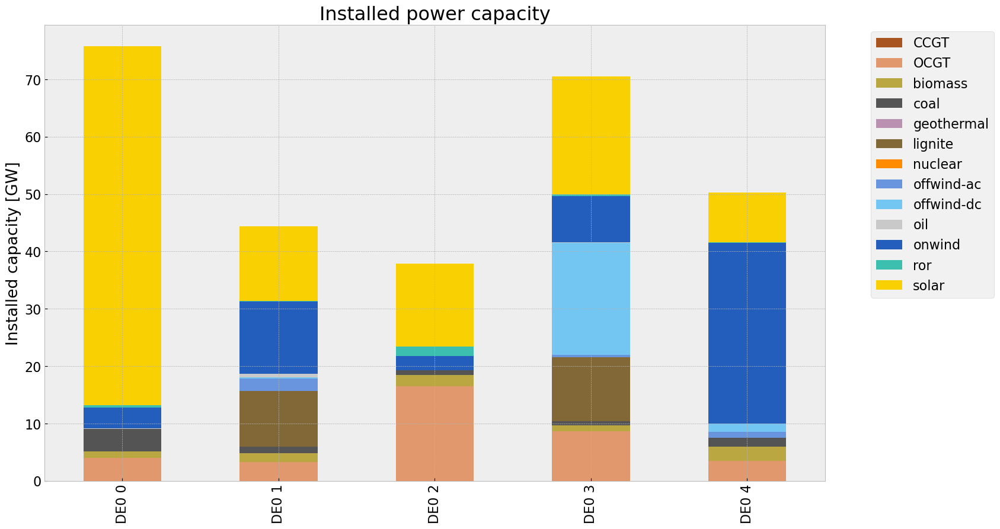

In [163]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

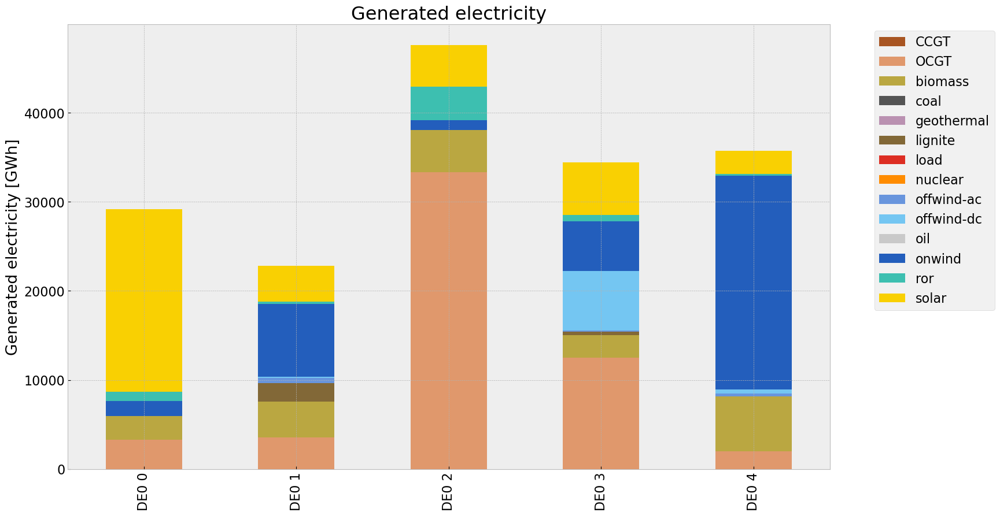

In [164]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\2615338355.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\2615338355.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.ca

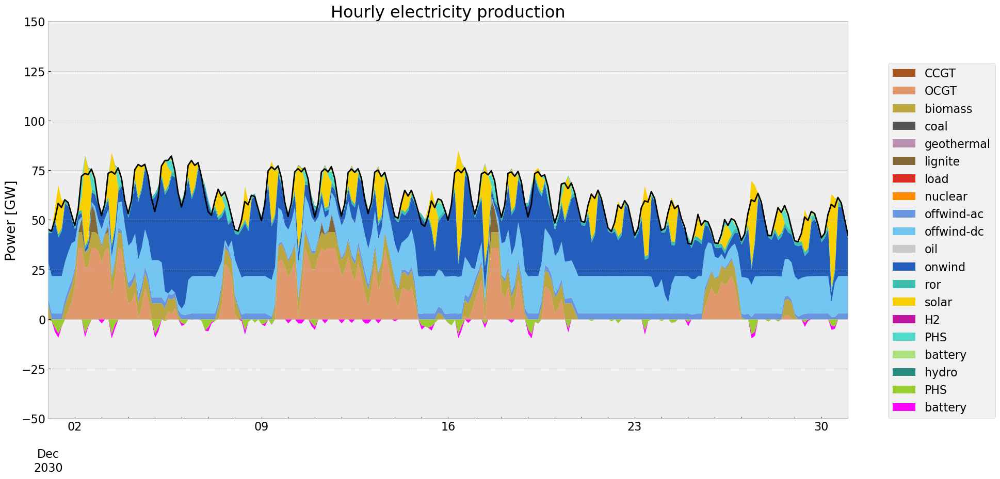

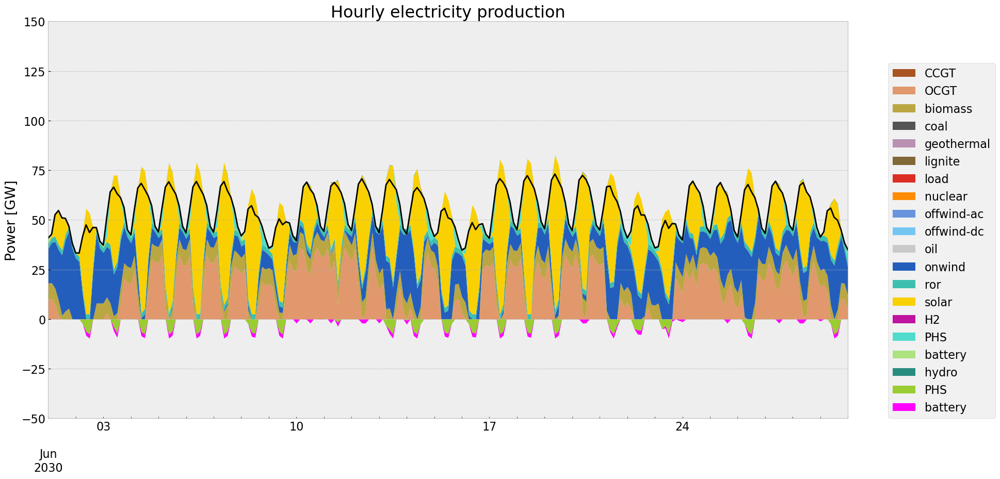

In [165]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\1075419132.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\1075419132.py:4: FutureWarning: 'H' is deprecated and will be removed in a future version

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.467019e+07,0.499437,0.1980,2.167381e+07
biomass,2.014244e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,2.429932e+06,0.358368,0.4069,2.759009e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.030717e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


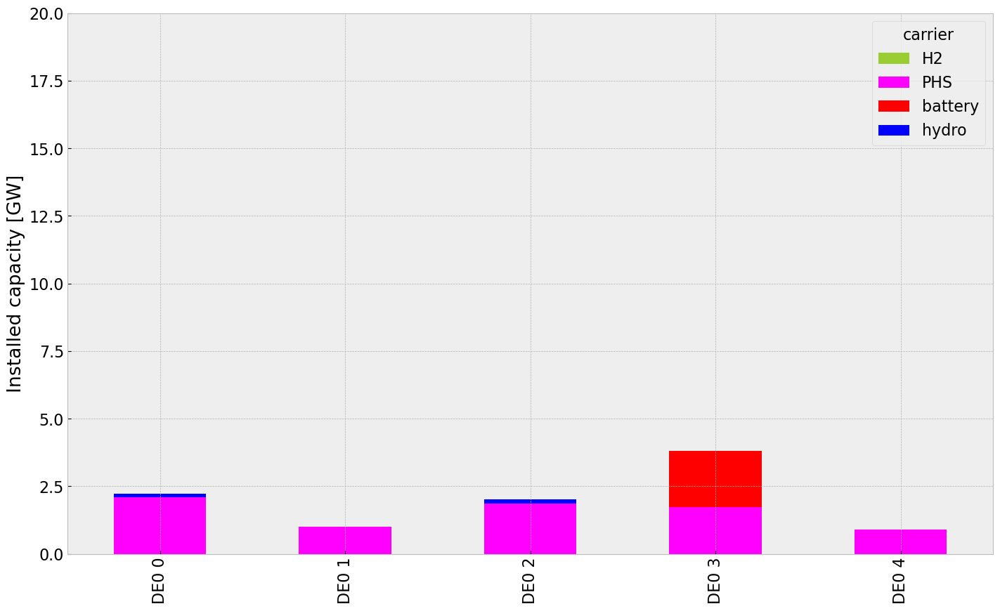

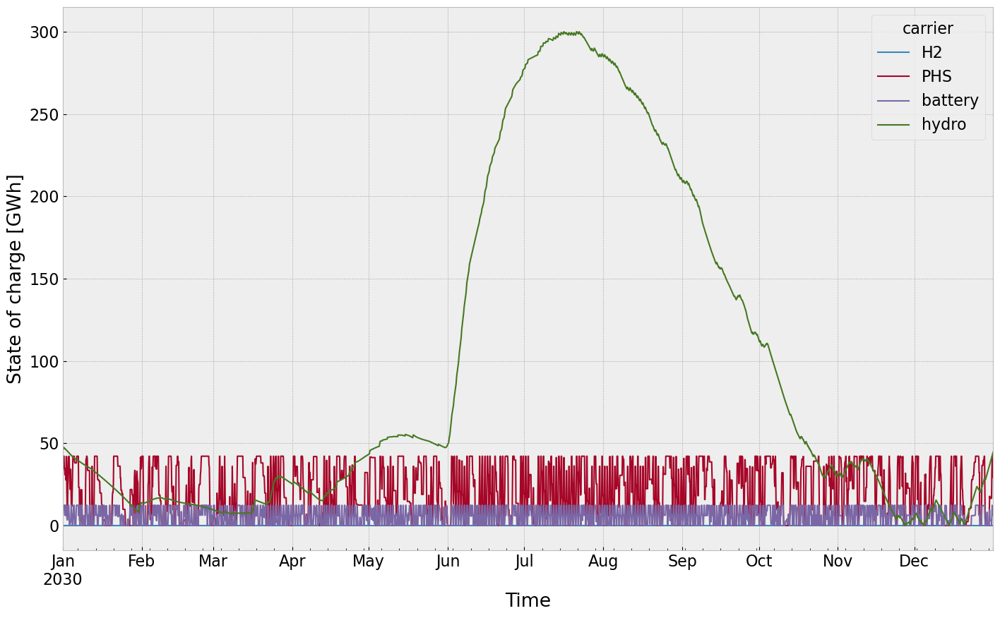

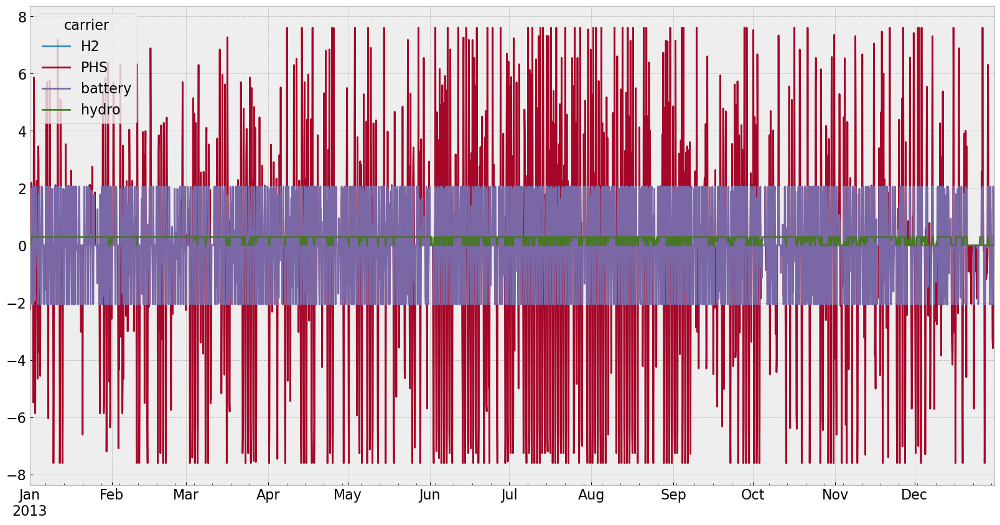

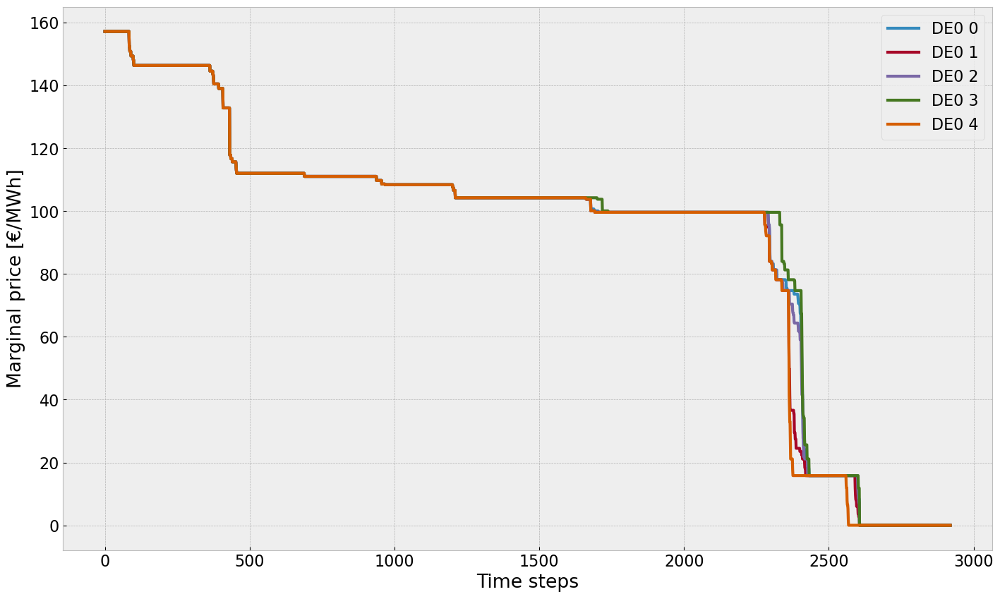

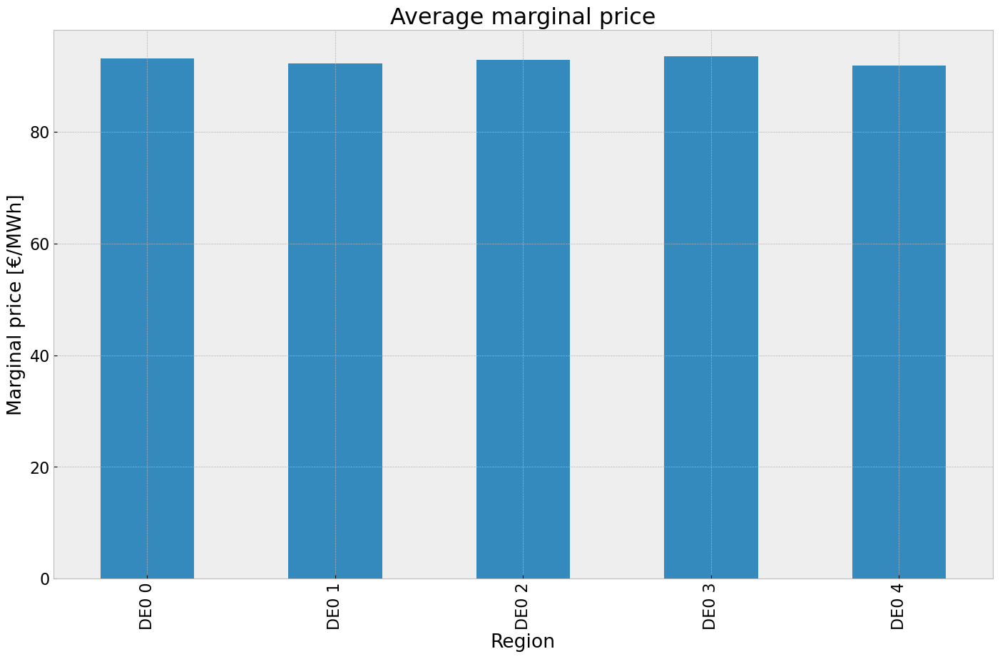

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


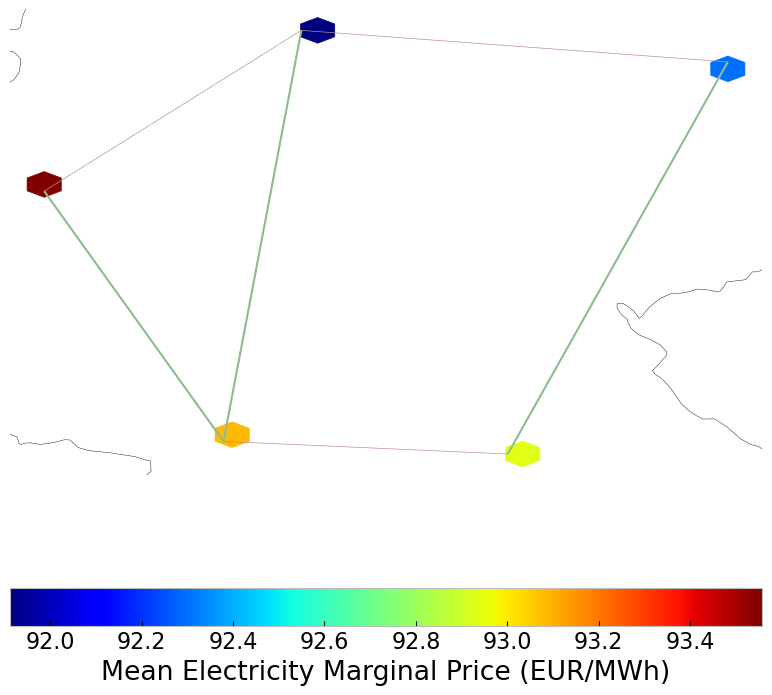

In [166]:
#storage unit & stores
inst_store_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [167]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4u_43lpq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4u_43lpq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x72e30615


INFO:gurobipy:Model fingerprint: 0x72e30615


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1350 columns


INFO:gurobipy:Presolve removed 6127 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     561    3.4733287e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     561    3.4733287e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 561 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 561 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.473328706e+07


INFO:gurobipy:Optimal objective  3.473328706e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4o4n8a3i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4o4n8a3i.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x2c38b0dd


INFO:gurobipy:Model fingerprint: 0x2c38b0dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1351 columns


INFO:gurobipy:Presolve removed 6127 rows and 1351 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1724 columns, 2921 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1724 columns, 2921 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     481    1.1463522e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     481    1.1463522e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 481 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 481 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.146352220e+08


INFO:gurobipy:Optimal objective  1.146352220e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.15e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o9zh2kg9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o9zh2kg9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x64e1499e


INFO:gurobipy:Model fingerprint: 0x64e1499e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1360 columns


INFO:gurobipy:Presolve removed 6127 rows and 1360 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1715 columns, 2912 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1715 columns, 2912 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    3.2780426e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    3.2780426e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.278042647e+08


INFO:gurobipy:Optimal objective  3.278042647e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1whmktz7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1whmktz7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1b4f6fc5


INFO:gurobipy:Model fingerprint: 0x1b4f6fc5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1364 columns


INFO:gurobipy:Presolve removed 6127 rows and 1364 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1711 columns, 2908 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1711 columns, 2908 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    2.7483169e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    2.7483169e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.748316935e+08


INFO:gurobipy:Optimal objective  2.748316935e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3fodqq3w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3fodqq3w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x11002951


INFO:gurobipy:Model fingerprint: 0x11002951


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1357 columns


INFO:gurobipy:Presolve removed 6127 rows and 1357 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1718 columns, 2915 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1718 columns, 2915 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    3.4497863e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    3.4497863e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.449786270e+08


INFO:gurobipy:Optimal objective  3.449786270e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ln8qgyl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ln8qgyl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x556124bb


INFO:gurobipy:Model fingerprint: 0x556124bb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1354 columns


INFO:gurobipy:Presolve removed 6127 rows and 1354 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1721 columns, 2918 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1721 columns, 2918 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     439    3.8406155e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     439    3.8406155e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 439 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 439 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.840615534e+08


INFO:gurobipy:Optimal objective  3.840615534e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5p2qdctn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5p2qdctn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6854ac53


INFO:gurobipy:Model fingerprint: 0x6854ac53


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1358 columns


INFO:gurobipy:Presolve removed 6127 rows and 1358 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1717 columns, 2914 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1717 columns, 2914 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    1.7797212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    1.7797212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.779721246e+08


INFO:gurobipy:Optimal objective  1.779721246e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j_oxb31h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j_oxb31h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xab7f1a42


INFO:gurobipy:Model fingerprint: 0xab7f1a42


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1376 columns


INFO:gurobipy:Presolve removed 6127 rows and 1376 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1699 columns, 2896 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1699 columns, 2896 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    4.2571873e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    4.2571873e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.06 seconds (0.01 work units)


Optimal objective  4.257187309e+08


INFO:gurobipy:Optimal objective  4.257187309e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 4.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b4d5lrf4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b4d5lrf4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4e41b9a8


INFO:gurobipy:Model fingerprint: 0x4e41b9a8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1356 columns


INFO:gurobipy:Presolve removed 6127 rows and 1356 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1719 columns, 2916 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1719 columns, 2916 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.0452958e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.0452958e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.045295833e+08


INFO:gurobipy:Optimal objective  2.045295833e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.05e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i80szkap.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-i80szkap.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x82d7dbbb


INFO:gurobipy:Model fingerprint: 0x82d7dbbb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1343 columns


INFO:gurobipy:Presolve removed 6127 rows and 1343 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     608    6.4361764e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     608    6.4361764e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 608 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 608 iterations and 0.08 seconds (0.01 work units)


Optimal objective  6.436176364e+07


INFO:gurobipy:Optimal objective  6.436176364e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.44e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sniygw6j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sniygw6j.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6f243d9a


INFO:gurobipy:Model fingerprint: 0x6f243d9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1340 columns


INFO:gurobipy:Presolve removed 6127 rows and 1340 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1735 columns, 2932 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1735 columns, 2932 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    1.0814522e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    1.0814522e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.081452241e+08


INFO:gurobipy:Optimal objective  1.081452241e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.08e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qs_2xlyl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qs_2xlyl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x63229f82


INFO:gurobipy:Model fingerprint: 0x63229f82


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     517    5.6408888e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     517    5.6408888e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 517 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 517 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.640888823e+07


INFO:gurobipy:Optimal objective  5.640888823e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.64e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bl3jtzpj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bl3jtzpj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd177ad11


INFO:gurobipy:Model fingerprint: 0xd177ad11


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1335 columns


INFO:gurobipy:Presolve removed 6127 rows and 1335 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    3.2773589e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    3.2773589e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.277358860e+08


INFO:gurobipy:Optimal objective  3.277358860e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q4xx_wwo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q4xx_wwo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x9351f15b


INFO:gurobipy:Model fingerprint: 0x9351f15b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1356 columns


INFO:gurobipy:Presolve removed 6127 rows and 1356 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1719 columns, 2916 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1719 columns, 2916 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    1.7440345e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    1.7440345e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.744034450e+08


INFO:gurobipy:Optimal objective  1.744034450e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tf0isa1_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tf0isa1_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x36cac69d


INFO:gurobipy:Model fingerprint: 0x36cac69d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1348 columns


INFO:gurobipy:Presolve removed 6127 rows and 1348 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1727 columns, 2924 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1727 columns, 2924 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    3.1397297e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    3.1397297e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.139729680e+08


INFO:gurobipy:Optimal objective  3.139729680e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.14e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5m_1lz1s.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5m_1lz1s.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x233db4e8


INFO:gurobipy:Model fingerprint: 0x233db4e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1384 columns


INFO:gurobipy:Presolve removed 6127 rows and 1384 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1691 columns, 2888 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1691 columns, 2888 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    3.2201435e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    3.2201435e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.220143455e+08


INFO:gurobipy:Optimal objective  3.220143455e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fd0uq6ic.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fd0uq6ic.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x43d8b042


INFO:gurobipy:Model fingerprint: 0x43d8b042


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1350 columns


INFO:gurobipy:Presolve removed 6127 rows and 1350 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.6102381e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.6102381e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.610238105e+08


INFO:gurobipy:Optimal objective  2.610238105e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wy9gxkry.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wy9gxkry.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe532d1f7


INFO:gurobipy:Model fingerprint: 0xe532d1f7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    2.0045730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    2.0045730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.004572991e+08


INFO:gurobipy:Optimal objective  2.004572991e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-piydrakb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-piydrakb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb4948e4e


INFO:gurobipy:Model fingerprint: 0xb4948e4e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1338 columns


INFO:gurobipy:Presolve removed 6127 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     461    2.3897838e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     461    2.3897838e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 461 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 461 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.389783773e+08


INFO:gurobipy:Optimal objective  2.389783773e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.39e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vir3trev.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vir3trev.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd6d24103


INFO:gurobipy:Model fingerprint: 0xd6d24103


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1352 columns


INFO:gurobipy:Presolve removed 6127 rows and 1352 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1723 columns, 2920 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1723 columns, 2920 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    3.6620543e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    3.6620543e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.662054331e+08


INFO:gurobipy:Optimal objective  3.662054331e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fkx4xu4t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fkx4xu4t.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x023d5300


INFO:gurobipy:Model fingerprint: 0x023d5300


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1350 columns


INFO:gurobipy:Presolve removed 6127 rows and 1350 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     482    1.3591573e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     482    1.3591573e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 482 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 482 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.359157250e+08


INFO:gurobipy:Optimal objective  1.359157250e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ouorzvc4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ouorzvc4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x5bbbeb4e


INFO:gurobipy:Model fingerprint: 0x5bbbeb4e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1345 columns


INFO:gurobipy:Presolve removed 6127 rows and 1345 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1730 columns, 2927 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1730 columns, 2927 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     507    1.6988733e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     507    1.6988733e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 507 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 507 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.698873292e+08


INFO:gurobipy:Optimal objective  1.698873292e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.70e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1vq029ep.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1vq029ep.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf527caf2


INFO:gurobipy:Model fingerprint: 0xf527caf2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1334 columns


INFO:gurobipy:Presolve removed 6127 rows and 1334 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     508    5.2367771e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     508    5.2367771e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 508 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 508 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.236777143e+07


INFO:gurobipy:Optimal objective  5.236777143e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.24e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5kb4kqbe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5kb4kqbe.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4e67e00b


INFO:gurobipy:Model fingerprint: 0x4e67e00b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    3.0252639e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    3.0252639e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.025263887e+08


INFO:gurobipy:Optimal objective  3.025263887e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4zk1ju3n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4zk1ju3n.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x8400e771


INFO:gurobipy:Model fingerprint: 0x8400e771


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1340 columns


INFO:gurobipy:Presolve removed 6127 rows and 1340 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 504 rows, 1735 columns, 2932 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1735 columns, 2932 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     444    1.8983856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     444    1.8983856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 444 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 444 iterations and 0.08 seconds (0.01 work units)


Optimal objective  1.898385618e+08


INFO:gurobipy:Optimal objective  1.898385618e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.90e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3p6dd51.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3p6dd51.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6d5b59ad


INFO:gurobipy:Model fingerprint: 0x6d5b59ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    1.1950178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    1.1950178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.195017786e+08


INFO:gurobipy:Optimal objective  1.195017786e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nhev98cs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nhev98cs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf6dd0275


INFO:gurobipy:Model fingerprint: 0xf6dd0275


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     496    2.3069761e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     496    2.3069761e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 496 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 496 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.306976135e+08


INFO:gurobipy:Optimal objective  2.306976135e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.31e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u9jj7urc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u9jj7urc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6c08bc84


INFO:gurobipy:Model fingerprint: 0x6c08bc84


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     504    6.8201796e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     504    6.8201796e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 504 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 504 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.820179592e+06


INFO:gurobipy:Optimal objective  6.820179592e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.82e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lcs5uabl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lcs5uabl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x2d7b7edc


INFO:gurobipy:Model fingerprint: 0x2d7b7edc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1334 columns


INFO:gurobipy:Presolve removed 6127 rows and 1334 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     423    1.4569243e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     423    1.4569243e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 423 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 423 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.456924283e+08


INFO:gurobipy:Optimal objective  1.456924283e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v4ms61v7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v4ms61v7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa8fadb1a


INFO:gurobipy:Model fingerprint: 0xa8fadb1a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1343 columns


INFO:gurobipy:Presolve removed 6127 rows and 1343 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     431    1.7592085e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     431    1.7592085e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 431 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 431 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.759208547e+08


INFO:gurobipy:Optimal objective  1.759208547e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vlw48q_a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vlw48q_a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x20920b04


INFO:gurobipy:Model fingerprint: 0x20920b04


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    1.5619908e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    1.5619908e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.561990751e+08


INFO:gurobipy:Optimal objective  1.561990751e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-64pz3rjq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-64pz3rjq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf9980b2f


INFO:gurobipy:Model fingerprint: 0xf9980b2f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1333 columns


INFO:gurobipy:Presolve removed 6127 rows and 1333 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1742 columns, 2939 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1742 columns, 2939 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     503    2.4039124e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     503    2.4039124e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 503 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 503 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.403912390e+08


INFO:gurobipy:Optimal objective  2.403912390e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9o3rwafg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9o3rwafg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x04bdfda8


INFO:gurobipy:Model fingerprint: 0x04bdfda8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1341 columns


INFO:gurobipy:Presolve removed 6127 rows and 1341 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1734 columns, 2931 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1734 columns, 2931 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     434    1.6257774e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     434    1.6257774e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 434 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 434 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.625777391e+08


INFO:gurobipy:Optimal objective  1.625777391e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ihi70gl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1ihi70gl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe65c0002


INFO:gurobipy:Model fingerprint: 0xe65c0002


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.0684504e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.0684504e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.068450384e+08


INFO:gurobipy:Optimal objective  2.068450384e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.07e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8m88d8nx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8m88d8nx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd414cbf3


INFO:gurobipy:Model fingerprint: 0xd414cbf3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1335 columns


INFO:gurobipy:Presolve removed 6127 rows and 1335 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     421    7.4089042e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     421    7.4089042e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 421 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 421 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.408904173e+07


INFO:gurobipy:Optimal objective  7.408904173e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.41e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zk2b12p6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zk2b12p6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x31f97900


INFO:gurobipy:Model fingerprint: 0x31f97900


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1342 columns


INFO:gurobipy:Presolve removed 6127 rows and 1342 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1733 columns, 2930 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1733 columns, 2930 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     386    1.1300514e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     386    1.1300514e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 386 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 386 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.130051403e+08


INFO:gurobipy:Optimal objective  1.130051403e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.13e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yb9f_f64.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yb9f_f64.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x8841a38b


INFO:gurobipy:Model fingerprint: 0x8841a38b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1340 columns


INFO:gurobipy:Presolve removed 6127 rows and 1340 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1735 columns, 2932 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1735 columns, 2932 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     384    1.2910653e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     384    1.2910653e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 384 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 384 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.291065269e+08


INFO:gurobipy:Optimal objective  1.291065269e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.29e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zm1p9t3r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zm1p9t3r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7bea6680


INFO:gurobipy:Model fingerprint: 0x7bea6680


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1348 columns


INFO:gurobipy:Presolve removed 6127 rows and 1348 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1727 columns, 2924 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1727 columns, 2924 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     370    1.4501112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     370    1.4501112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 370 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 370 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.450111214e+08


INFO:gurobipy:Optimal objective  1.450111214e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5jy8bjmp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5jy8bjmp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x52befd0c


INFO:gurobipy:Model fingerprint: 0x52befd0c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1346 columns


INFO:gurobipy:Presolve removed 6127 rows and 1346 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1729 columns, 2926 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1729 columns, 2926 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     391    1.8009926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     391    1.8009926e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 391 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 391 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.800992550e+08


INFO:gurobipy:Optimal objective  1.800992550e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.80e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-233vutmg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-233vutmg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x5484c6d4


INFO:gurobipy:Model fingerprint: 0x5484c6d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1343 columns


INFO:gurobipy:Presolve removed 6127 rows and 1343 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     395    1.6566904e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     395    1.6566904e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 395 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 395 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.656690352e+08


INFO:gurobipy:Optimal objective  1.656690352e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-09vjhely.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-09vjhely.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x94118b1b


INFO:gurobipy:Model fingerprint: 0x94118b1b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     405    1.8169454e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     405    1.8169454e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 405 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 405 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.816945446e+08


INFO:gurobipy:Optimal objective  1.816945446e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qs17azad.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qs17azad.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x839d01e8


INFO:gurobipy:Model fingerprint: 0x839d01e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1341 columns


INFO:gurobipy:Presolve removed 6127 rows and 1341 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1734 columns, 2931 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1734 columns, 2931 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     389    1.3162812e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     389    1.3162812e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 389 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 389 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.316281238e+08


INFO:gurobipy:Optimal objective  1.316281238e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r4pfhb10.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r4pfhb10.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x884a2575


INFO:gurobipy:Model fingerprint: 0x884a2575


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     396    1.6460118e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     396    1.6460118e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 396 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 396 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.646011799e+08


INFO:gurobipy:Optimal objective  1.646011799e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.65e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ynv_2zz5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ynv_2zz5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf1b50684


INFO:gurobipy:Model fingerprint: 0xf1b50684


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1327 columns


INFO:gurobipy:Presolve removed 6127 rows and 1327 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1748 columns, 2945 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1748 columns, 2945 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.1064067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.1064067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.106406660e+08


INFO:gurobipy:Optimal objective  1.106406660e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2wime0wu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2wime0wu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe6a73ec2


INFO:gurobipy:Model fingerprint: 0xe6a73ec2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1320 columns


INFO:gurobipy:Presolve removed 6127 rows and 1320 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1755 columns, 2952 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1755 columns, 2952 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    1.3996951e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    1.3996951e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.399695084e+08


INFO:gurobipy:Optimal objective  1.399695084e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vrmnpnnf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vrmnpnnf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x551dedaa


INFO:gurobipy:Model fingerprint: 0x551dedaa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1324 columns


INFO:gurobipy:Presolve removed 6127 rows and 1324 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1751 columns, 2948 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1751 columns, 2948 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.8163360e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.8163360e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.816335973e+08


INFO:gurobipy:Optimal objective  1.816335973e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3m1kzc87.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3m1kzc87.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x68bcddb5


INFO:gurobipy:Model fingerprint: 0x68bcddb5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1319 columns


INFO:gurobipy:Presolve removed 6127 rows and 1319 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1756 columns, 2953 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1756 columns, 2953 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     446    1.3428375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     446    1.3428375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 446 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 446 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.342837498e+08


INFO:gurobipy:Optimal objective  1.342837498e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7_gu1020.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7_gu1020.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xbd416d71


INFO:gurobipy:Model fingerprint: 0xbd416d71


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1334 columns


INFO:gurobipy:Presolve removed 6127 rows and 1334 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     515    1.8206591e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     515    1.8206591e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 515 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 515 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.820659132e+08


INFO:gurobipy:Optimal objective  1.820659132e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n2w4z0am.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n2w4z0am.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x97395e8c


INFO:gurobipy:Model fingerprint: 0x97395e8c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1331 columns


INFO:gurobipy:Presolve removed 6127 rows and 1331 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1744 columns, 2941 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1744 columns, 2941 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    9.7415441e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    9.7415441e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.741544076e+07


INFO:gurobipy:Optimal objective  9.741544076e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.74e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dlq31_e7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dlq31_e7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6291ac55


INFO:gurobipy:Model fingerprint: 0x6291ac55


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1343 columns


INFO:gurobipy:Presolve removed 6127 rows and 1343 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1732 columns, 2929 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    1.7796246e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    1.7796246e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.779624565e+08


INFO:gurobipy:Optimal objective  1.779624565e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ryvkz6md.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ryvkz6md.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0e85b688


INFO:gurobipy:Model fingerprint: 0x0e85b688


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 4e+02]


INFO:gurobipy:  Bounds range     [1e+02, 4e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1323 columns


INFO:gurobipy:Presolve removed 6127 rows and 1323 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1752 columns, 2949 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1752 columns, 2949 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     406    2.6075475e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     406    2.6075475e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 406 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 406 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.607547474e+07


INFO:gurobipy:Optimal objective  2.607547474e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.61e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8nv2o3y3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8nv2o3y3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x68f5b520


INFO:gurobipy:Model fingerprint: 0x68f5b520


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1321 columns


INFO:gurobipy:Presolve removed 6127 rows and 1321 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1754 columns, 2951 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1754 columns, 2951 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     375    1.0575069e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     375    1.0575069e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 375 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 375 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.057506930e+08


INFO:gurobipy:Optimal objective  1.057506930e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kdz8x6uo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kdz8x6uo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x5f5d3e15


INFO:gurobipy:Model fingerprint: 0x5f5d3e15


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1338 columns


INFO:gurobipy:Presolve removed 6127 rows and 1338 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     383    1.2213321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     383    1.2213321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 383 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 383 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.221332143e+08


INFO:gurobipy:Optimal objective  1.221332143e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hf7r331a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hf7r331a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xcbe16913


INFO:gurobipy:Model fingerprint: 0xcbe16913


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 4e+02]


INFO:gurobipy:  Bounds range     [2e+02, 4e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1338 columns


INFO:gurobipy:Presolve removed 6127 rows and 1338 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     383    1.8626606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     383    1.8626606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 383 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 383 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.862660597e+08


INFO:gurobipy:Optimal objective  1.862660597e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.86e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ug97uw3b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ug97uw3b.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa03d76f2


INFO:gurobipy:Model fingerprint: 0xa03d76f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.08s


INFO:gurobipy:Presolve time: 0.08s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     413    1.0362503e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     413    1.0362503e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 413 iterations and 0.10 seconds (0.01 work units)


INFO:gurobipy:Solved in 413 iterations and 0.10 seconds (0.01 work units)


Optimal objective  1.036250307e+08


INFO:gurobipy:Optimal objective  1.036250307e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.04e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-avcap_ue.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-avcap_ue.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe23f506b


INFO:gurobipy:Model fingerprint: 0xe23f506b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1318 columns


INFO:gurobipy:Presolve removed 6127 rows and 1318 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1757 columns, 2954 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1757 columns, 2954 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     390    8.1208673e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     390    8.1208673e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 390 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 390 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.120867347e+07


INFO:gurobipy:Optimal objective  8.120867347e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 8.12e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-it8ndi_d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-it8ndi_d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6bbd339c


INFO:gurobipy:Model fingerprint: 0x6bbd339c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1328 columns


INFO:gurobipy:Presolve removed 6127 rows and 1328 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1747 columns, 2944 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1747 columns, 2944 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     426    1.5122915e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     426    1.5122915e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 426 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 426 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.512291541e+08


INFO:gurobipy:Optimal objective  1.512291541e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.51e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0vthdn68.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0vthdn68.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa083d4f1


INFO:gurobipy:Model fingerprint: 0xa083d4f1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1314 columns


INFO:gurobipy:Presolve removed 6127 rows and 1314 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 504 rows, 1761 columns, 2958 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1761 columns, 2958 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     385    3.9343584e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     385    3.9343584e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 385 iterations and 0.13 seconds (0.01 work units)


INFO:gurobipy:Solved in 385 iterations and 0.13 seconds (0.01 work units)


Optimal objective  3.934358439e+07


INFO:gurobipy:Optimal objective  3.934358439e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dy98gu3_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dy98gu3_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa027780b


INFO:gurobipy:Model fingerprint: 0xa027780b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1317 columns


INFO:gurobipy:Presolve removed 6127 rows and 1317 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1758 columns, 2955 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1758 columns, 2955 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    1.2146670e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    1.2146670e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.214666956e+08


INFO:gurobipy:Optimal objective  1.214666956e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.21e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sutxm177.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sutxm177.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb12b2771


INFO:gurobipy:Model fingerprint: 0xb12b2771


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1327 columns


INFO:gurobipy:Presolve removed 6127 rows and 1327 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1748 columns, 2945 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1748 columns, 2945 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     373    1.2616647e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     373    1.2616647e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 373 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 373 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.261664746e+08


INFO:gurobipy:Optimal objective  1.261664746e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.26e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sv0fcyw7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sv0fcyw7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x858c2b9e


INFO:gurobipy:Model fingerprint: 0x858c2b9e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1330 columns


INFO:gurobipy:Presolve removed 6127 rows and 1330 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1745 columns, 2942 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1745 columns, 2942 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     411    1.0862726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     411    1.0862726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 411 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 411 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.086272566e+08


INFO:gurobipy:Optimal objective  1.086272566e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.09e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d3l1czmz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d3l1czmz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x82fec891


INFO:gurobipy:Model fingerprint: 0x82fec891


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     390    2.0978754e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     390    2.0978754e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 390 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 390 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.097875356e+08


INFO:gurobipy:Optimal objective  2.097875356e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jo5k49dx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jo5k49dx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x2db9a38f


INFO:gurobipy:Model fingerprint: 0x2db9a38f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1325 columns


INFO:gurobipy:Presolve removed 6127 rows and 1325 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1750 columns, 2947 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1750 columns, 2947 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     374    1.0121765e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     374    1.0121765e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 374 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 374 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.012176539e+08


INFO:gurobipy:Optimal objective  1.012176539e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z0uzw4ph.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z0uzw4ph.lp


Reading time = 0.08 seconds


INFO:gurobipy:Reading time = 0.08 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x59ce3a75


INFO:gurobipy:Model fingerprint: 0x59ce3a75


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1317 columns


INFO:gurobipy:Presolve removed 6127 rows and 1317 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1758 columns, 2955 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1758 columns, 2955 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    1.2231854e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    1.2231854e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.223185417e+08


INFO:gurobipy:Optimal objective  1.223185417e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-var3d4tr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-var3d4tr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x24a818e2


INFO:gurobipy:Model fingerprint: 0x24a818e2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1335 columns


INFO:gurobipy:Presolve removed 6127 rows and 1335 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    1.0062032e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    1.0062032e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.006203236e+08


INFO:gurobipy:Optimal objective  1.006203236e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.01e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e24qanap.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e24qanap.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x82de2918


INFO:gurobipy:Model fingerprint: 0x82de2918


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1341 columns


INFO:gurobipy:Presolve removed 6127 rows and 1341 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1734 columns, 2931 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1734 columns, 2931 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    1.5208927e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    1.5208927e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.520892711e+08


INFO:gurobipy:Optimal objective  1.520892711e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f9c1pawc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f9c1pawc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xaa64be57


INFO:gurobipy:Model fingerprint: 0xaa64be57


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1323 columns


INFO:gurobipy:Presolve removed 6127 rows and 1323 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1752 columns, 2949 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1752 columns, 2949 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    1.1070165e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    1.1070165e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.107016508e+08


INFO:gurobipy:Optimal objective  1.107016508e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.11e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w0je50vx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w0je50vx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe87a1518


INFO:gurobipy:Model fingerprint: 0xe87a1518


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1367 columns


INFO:gurobipy:Presolve removed 6127 rows and 1367 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1708 columns, 2905 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1708 columns, 2905 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.3753793e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.3753793e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.375379269e+08


INFO:gurobipy:Optimal objective  1.375379269e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t2f44ajf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t2f44ajf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1fe56643


INFO:gurobipy:Model fingerprint: 0x1fe56643


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1370 columns


INFO:gurobipy:Presolve removed 6127 rows and 1370 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1705 columns, 2902 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1705 columns, 2902 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    2.1717190e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    2.1717190e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.171718988e+08


INFO:gurobipy:Optimal objective  2.171718988e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-khrxy4x_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-khrxy4x_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4ab19349


INFO:gurobipy:Model fingerprint: 0x4ab19349


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1342 columns


INFO:gurobipy:Presolve removed 6127 rows and 1342 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1733 columns, 2930 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1733 columns, 2930 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     430    1.6106928e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     430    1.6106928e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 430 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 430 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.610692820e+08


INFO:gurobipy:Optimal objective  1.610692820e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nb0dhmf_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nb0dhmf_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x96e07987


INFO:gurobipy:Model fingerprint: 0x96e07987


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1335 columns


INFO:gurobipy:Presolve removed 6127 rows and 1335 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1740 columns, 2937 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.2466805e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.2466805e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.246680455e+08


INFO:gurobipy:Optimal objective  1.246680455e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f2ua6sov.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f2ua6sov.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xbc8283f4


INFO:gurobipy:Model fingerprint: 0xbc8283f4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1350 columns


INFO:gurobipy:Presolve removed 6127 rows and 1350 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1725 columns, 2922 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     440    1.0968199e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     440    1.0968199e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 440 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 440 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.096819946e+08


INFO:gurobipy:Optimal objective  1.096819946e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28vg__t5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28vg__t5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x3e3dcddf


INFO:gurobipy:Model fingerprint: 0x3e3dcddf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1346 columns


INFO:gurobipy:Presolve removed 6127 rows and 1346 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1729 columns, 2926 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1729 columns, 2926 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    1.6312778e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    1.6312778e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.631277765e+08


INFO:gurobipy:Optimal objective  1.631277765e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.63e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n051wcm2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n051wcm2.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4361121e


INFO:gurobipy:Model fingerprint: 0x4361121e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1349 columns


INFO:gurobipy:Presolve removed 6127 rows and 1349 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1726 columns, 2923 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1726 columns, 2923 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     449    1.8209606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     449    1.8209606e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 449 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 449 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.820960600e+08


INFO:gurobipy:Optimal objective  1.820960600e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.82e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zdy0n9vw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zdy0n9vw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x943859ed


INFO:gurobipy:Model fingerprint: 0x943859ed


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.0279726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.0279726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.027972602e+08


INFO:gurobipy:Optimal objective  1.027972602e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pk21yavm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pk21yavm.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa465bb4d


INFO:gurobipy:Model fingerprint: 0xa465bb4d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1367 columns


INFO:gurobipy:Presolve removed 6127 rows and 1367 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1708 columns, 2905 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1708 columns, 2905 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     442    1.3443577e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     442    1.3443577e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 442 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 442 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.344357737e+08


INFO:gurobipy:Optimal objective  1.344357737e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.34e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b0ijq0a1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b0ijq0a1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x26aedf07


INFO:gurobipy:Model fingerprint: 0x26aedf07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1338 columns


INFO:gurobipy:Presolve removed 6127 rows and 1338 columns


Presolve time: 0.10s


INFO:gurobipy:Presolve time: 0.10s


Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     441    1.4710622e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     441    1.4710622e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 441 iterations and 0.14 seconds (0.01 work units)


INFO:gurobipy:Solved in 441 iterations and 0.14 seconds (0.01 work units)


Optimal objective  1.471062225e+08


INFO:gurobipy:Optimal objective  1.471062225e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jo99e7ef.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jo99e7ef.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x80b4065d


INFO:gurobipy:Model fingerprint: 0x80b4065d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1368 columns


INFO:gurobipy:Presolve removed 6127 rows and 1368 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1707 columns, 2904 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1707 columns, 2904 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    1.8757025e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    1.8757025e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.875702467e+08


INFO:gurobipy:Optimal objective  1.875702467e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.88e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eia1eo4b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eia1eo4b.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xbd3530d9


INFO:gurobipy:Model fingerprint: 0xbd3530d9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    9.6430999e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    9.6430999e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.643099857e+07


INFO:gurobipy:Optimal objective  9.643099857e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.64e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zaobnirl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zaobnirl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7c1d1bbc


INFO:gurobipy:Model fingerprint: 0x7c1d1bbc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1338 columns


INFO:gurobipy:Presolve removed 6127 rows and 1338 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1737 columns, 2934 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    2.0908759e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    2.0908759e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.090875907e+08


INFO:gurobipy:Optimal objective  2.090875907e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.09e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8qj66yzj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8qj66yzj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xecd69699


INFO:gurobipy:Model fingerprint: 0xecd69699


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1367 columns


INFO:gurobipy:Presolve removed 6127 rows and 1367 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1708 columns, 2905 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1708 columns, 2905 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    1.5549090e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    1.5549090e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.554908999e+08


INFO:gurobipy:Optimal objective  1.554908999e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0mw67xw6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0mw67xw6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x2d95fc93


INFO:gurobipy:Model fingerprint: 0x2d95fc93


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     490    7.7665125e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     490    7.7665125e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 490 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 490 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.766512479e+07


INFO:gurobipy:Optimal objective  7.766512479e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.77e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ujrtqe09.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ujrtqe09.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb3d244d3


INFO:gurobipy:Model fingerprint: 0xb3d244d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1352 columns


INFO:gurobipy:Presolve removed 6127 rows and 1352 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1723 columns, 2920 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1723 columns, 2920 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    1.4863835e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    1.4863835e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.486383482e+08


INFO:gurobipy:Optimal objective  1.486383482e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lkxezkvn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lkxezkvn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3059 columns, 10817 nonzeros


INFO:gurobipy:obj: 6631 rows, 3059 columns, 10817 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3059 columns and 10817 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3059 columns and 10817 nonzeros


Model fingerprint: 0xb0b6d81b


INFO:gurobipy:Model fingerprint: 0xb0b6d81b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+01, 7e+01]


INFO:gurobipy:  Bounds range     [1e+01, 7e+01]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6139 rows and 1399 columns


INFO:gurobipy:Presolve removed 6139 rows and 1399 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 492 rows, 1660 columns, 2845 nonzeros


INFO:gurobipy:Presolved: 492 rows, 1660 columns, 2845 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.6576726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.6576726e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.657672616e+08


INFO:gurobipy:Optimal objective  1.657672616e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3059 primals, 6631 duals
Objective: 1.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b9agk8v1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b9agk8v1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x699baad0


INFO:gurobipy:Model fingerprint: 0x699baad0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1337 columns


INFO:gurobipy:Presolve removed 6127 rows and 1337 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1738 columns, 2935 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1738 columns, 2935 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     468    2.7818899e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     468    2.7818899e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 468 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 468 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.781889871e+08


INFO:gurobipy:Optimal objective  2.781889871e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.78e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tpqus7cc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tpqus7cc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xdccd42a1


INFO:gurobipy:Model fingerprint: 0xdccd42a1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 9e+01]


INFO:gurobipy:  Bounds range     [6e+01, 9e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    1.8414714e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    1.8414714e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.841471382e+08


INFO:gurobipy:Optimal objective  1.841471382e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-buzm2fc4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-buzm2fc4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x12e0f2ef


INFO:gurobipy:Model fingerprint: 0x12e0f2ef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     443    1.8480644e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     443    1.8480644e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 443 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 443 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.848064400e+08


INFO:gurobipy:Optimal objective  1.848064400e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.85e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dod1mesu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dod1mesu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x904fbe16


INFO:gurobipy:Model fingerprint: 0x904fbe16


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1344 columns


INFO:gurobipy:Presolve removed 6127 rows and 1344 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1731 columns, 2928 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1731 columns, 2928 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    2.2192947e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    2.2192947e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.219294675e+08


INFO:gurobipy:Optimal objective  2.219294675e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oe1fc6pg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oe1fc6pg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x08f13a0b


INFO:gurobipy:Model fingerprint: 0x08f13a0b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1361 columns


INFO:gurobipy:Presolve removed 6127 rows and 1361 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1714 columns, 2911 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1714 columns, 2911 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     449    1.3233233e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     449    1.3233233e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 449 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 449 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.323323339e+08


INFO:gurobipy:Optimal objective  1.323323339e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6h16__03.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6h16__03.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3069 columns, 10827 nonzeros


INFO:gurobipy:obj: 6631 rows, 3069 columns, 10827 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3069 columns and 10827 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3069 columns and 10827 nonzeros


Model fingerprint: 0x9d75f9dc


INFO:gurobipy:Model fingerprint: 0x9d75f9dc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+01, 8e+01]


INFO:gurobipy:  Bounds range     [1e+01, 8e+01]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6131 rows and 1362 columns


INFO:gurobipy:Presolve removed 6131 rows and 1362 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 500 rows, 1707 columns, 2900 nonzeros


INFO:gurobipy:Presolved: 500 rows, 1707 columns, 2900 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    2.6565897e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    2.6565897e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.656589711e+08


INFO:gurobipy:Optimal objective  2.656589711e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3069 primals, 6631 duals
Objective: 2.66e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2x8nd9c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r2x8nd9c.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1a2d60a8


INFO:gurobipy:Model fingerprint: 0x1a2d60a8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     430    9.0896292e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     430    9.0896292e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 430 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 430 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.089629202e+07


INFO:gurobipy:Optimal objective  9.089629202e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.09e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e212rzm8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e212rzm8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4d715ab5


INFO:gurobipy:Model fingerprint: 0x4d715ab5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    8.3780631e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    8.3780631e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  8.378063099e+07


INFO:gurobipy:Optimal objective  8.378063099e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 8.38e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-74k_x384.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-74k_x384.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa5d5cf53


INFO:gurobipy:Model fingerprint: 0xa5d5cf53


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1345 columns


INFO:gurobipy:Presolve removed 6127 rows and 1345 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1730 columns, 2927 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1730 columns, 2927 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    1.9417279e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    1.9417279e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.941727870e+08


INFO:gurobipy:Optimal objective  1.941727870e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kvchotbg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kvchotbg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1c6563f2


INFO:gurobipy:Model fingerprint: 0x1c6563f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1355 columns


INFO:gurobipy:Presolve removed 6127 rows and 1355 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1720 columns, 2917 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1720 columns, 2917 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     518    2.9948990e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     518    2.9948990e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 518 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 518 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.994899000e+08


INFO:gurobipy:Optimal objective  2.994899000e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-shsi351h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-shsi351h.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe7fafcf4


INFO:gurobipy:Model fingerprint: 0xe7fafcf4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1349 columns


INFO:gurobipy:Presolve removed 6127 rows and 1349 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1726 columns, 2923 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1726 columns, 2923 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    2.2849598e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    2.2849598e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.284959812e+08


INFO:gurobipy:Optimal objective  2.284959812e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xliiyuj2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xliiyuj2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0cde04bf


INFO:gurobipy:Model fingerprint: 0x0cde04bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1332 columns


INFO:gurobipy:Presolve removed 6127 rows and 1332 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1743 columns, 2940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     474    2.2467082e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     474    2.2467082e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 474 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 474 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.246708234e+08


INFO:gurobipy:Optimal objective  2.246708234e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.25e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1gk00j9d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1gk00j9d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xee7028f6


INFO:gurobipy:Model fingerprint: 0xee7028f6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1339 columns


INFO:gurobipy:Presolve removed 6127 rows and 1339 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1736 columns, 2933 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1736 columns, 2933 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    1.9931325e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    1.9931325e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.993132463e+08


INFO:gurobipy:Optimal objective  1.993132463e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l39nshcr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l39nshcr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x778a4e4e


INFO:gurobipy:Model fingerprint: 0x778a4e4e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1334 columns


INFO:gurobipy:Presolve removed 6127 rows and 1334 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1741 columns, 2938 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     416    1.2396988e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     416    1.2396988e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 416 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 416 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.239698819e+08


INFO:gurobipy:Optimal objective  1.239698819e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.24e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-an_tz2u8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-an_tz2u8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd07169d4


INFO:gurobipy:Model fingerprint: 0xd07169d4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 9e+01]


INFO:gurobipy:  Bounds range     [4e+01, 9e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     444    1.4131941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     444    1.4131941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 444 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 444 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.413194131e+08


INFO:gurobipy:Optimal objective  1.413194131e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdcpjvdh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdcpjvdh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe2e73b87


INFO:gurobipy:Model fingerprint: 0xe2e73b87


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 7e+01]


INFO:gurobipy:  Bounds range     [5e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1336 columns


INFO:gurobipy:Presolve removed 6127 rows and 1336 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1739 columns, 2936 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    8.2199435e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    8.2199435e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.219943484e+07


INFO:gurobipy:Optimal objective  8.219943484e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 8.22e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7fhz1_16.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7fhz1_16.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x2ae18ed7


INFO:gurobipy:Model fingerprint: 0x2ae18ed7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1339 columns


INFO:gurobipy:Presolve removed 6127 rows and 1339 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1736 columns, 2933 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1736 columns, 2933 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     557    6.5793701e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     557    6.5793701e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 557 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 557 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.579370127e+07


INFO:gurobipy:Optimal objective  6.579370127e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.58e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z41yavh5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z41yavh5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb173fbdb


INFO:gurobipy:Model fingerprint: 0xb173fbdb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6127 rows and 1247 columns


INFO:gurobipy:Presolve removed 6127 rows and 1247 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1828 columns, 3025 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1828 columns, 3025 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     507    6.8594230e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     507    6.8594230e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 507 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 507 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.859423036e+07


INFO:gurobipy:Optimal objective  6.859423036e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.86e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6rcbcbjk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6rcbcbjk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x35fbdb31


INFO:gurobipy:Model fingerprint: 0x35fbdb31


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1201 columns


INFO:gurobipy:Presolve removed 6127 rows and 1201 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1874 columns, 3071 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1874 columns, 3071 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     526    1.7903133e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     526    1.7903133e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 526 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 526 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.790313340e+07


INFO:gurobipy:Optimal objective  1.790313340e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.79e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y3zd6p8e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y3zd6p8e.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc22a21b1


INFO:gurobipy:Model fingerprint: 0xc22a21b1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1203 columns


INFO:gurobipy:Presolve removed 6127 rows and 1203 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1872 columns, 3069 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1872 columns, 3069 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.057420827e+08


INFO:gurobipy:Optimal objective  1.057420827e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ca0jfjvf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ca0jfjvf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x828ee52f


INFO:gurobipy:Model fingerprint: 0x828ee52f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    5.9887210e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    5.9887210e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.988720984e+07


INFO:gurobipy:Optimal objective  5.988720984e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cd2a0kd7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cd2a0kd7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1266966c


INFO:gurobipy:Model fingerprint: 0x1266966c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1226 columns


INFO:gurobipy:Presolve removed 6127 rows and 1226 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1849 columns, 3046 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1849 columns, 3046 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.528597448e+08


INFO:gurobipy:Optimal objective  1.528597448e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p6k9vf7w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p6k9vf7w.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7249d6a0


INFO:gurobipy:Model fingerprint: 0x7249d6a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1219 columns


INFO:gurobipy:Presolve removed 6127 rows and 1219 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1856 columns, 3053 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1856 columns, 3053 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.001924031e+08


INFO:gurobipy:Optimal objective  2.001924031e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d60dp2k8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d60dp2k8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd56b8d2d


INFO:gurobipy:Model fingerprint: 0xd56b8d2d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1215 columns


INFO:gurobipy:Presolve removed 6127 rows and 1215 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1860 columns, 3057 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1860 columns, 3057 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    2.5646212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    2.5646212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.564621150e+08


INFO:gurobipy:Optimal objective  2.564621150e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y620q855.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y620q855.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x09dc76ce


INFO:gurobipy:Model fingerprint: 0x09dc76ce


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1205 columns


INFO:gurobipy:Presolve removed 6127 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     513    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     513    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 513 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 513 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.182539431e+08


INFO:gurobipy:Optimal objective  2.182539431e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-thzz3dfo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-thzz3dfo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x400535af


INFO:gurobipy:Model fingerprint: 0x400535af


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6127 rows and 1212 columns


INFO:gurobipy:Presolve removed 6127 rows and 1212 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1863 columns, 3060 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1863 columns, 3060 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     461    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     461    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 461 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 461 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.476634917e+08


INFO:gurobipy:Optimal objective  1.476634917e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e3_ja0h5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e3_ja0h5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe5842293


INFO:gurobipy:Model fingerprint: 0xe5842293


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1221 columns


INFO:gurobipy:Presolve removed 6127 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     493    6.1934950e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     493    6.1934950e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 493 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 493 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.193495040e+07


INFO:gurobipy:Optimal objective  6.193495040e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-atnmhyq5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-atnmhyq5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x541334e8


INFO:gurobipy:Model fingerprint: 0x541334e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1221 columns


INFO:gurobipy:Presolve removed 6127 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.179461344e+08


INFO:gurobipy:Optimal objective  1.179461344e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ik4cup4v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ik4cup4v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd995352c


INFO:gurobipy:Model fingerprint: 0xd995352c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1217 columns


INFO:gurobipy:Presolve removed 6127 rows and 1217 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1858 columns, 3055 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1858 columns, 3055 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    9.8546675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    9.8546675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.854667451e+07


INFO:gurobipy:Optimal objective  9.854667451e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.85e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9ch3m45a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9ch3m45a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1d933753


INFO:gurobipy:Model fingerprint: 0x1d933753


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1208 columns


INFO:gurobipy:Presolve removed 6127 rows and 1208 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1867 columns, 3064 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1867 columns, 3064 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    2.8313219e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    2.8313219e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.831321943e+07


INFO:gurobipy:Optimal objective  2.831321943e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.83e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28_ur9ue.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-28_ur9ue.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7908a2d3


INFO:gurobipy:Model fingerprint: 0x7908a2d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1228 columns


INFO:gurobipy:Presolve removed 6127 rows and 1228 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1847 columns, 3044 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1847 columns, 3044 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    1.7898884e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    1.7898884e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.789888386e+08


INFO:gurobipy:Optimal objective  1.789888386e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-spj7cnjz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-spj7cnjz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x44234155


INFO:gurobipy:Model fingerprint: 0x44234155


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1218 columns


INFO:gurobipy:Presolve removed 6127 rows and 1218 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1857 columns, 3054 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1857 columns, 3054 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.401269626e+08


INFO:gurobipy:Optimal objective  1.401269626e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mozpj8x9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mozpj8x9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x997f9b0a


INFO:gurobipy:Model fingerprint: 0x997f9b0a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    7.1963479e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    7.1963479e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.196347862e+07


INFO:gurobipy:Optimal objective  7.196347862e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-imvyt_f4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-imvyt_f4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x548e5966


INFO:gurobipy:Model fingerprint: 0x548e5966


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1205 columns


INFO:gurobipy:Presolve removed 6127 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    4.7451682e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    4.7451682e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.04 seconds (0.01 work units)


Optimal objective  4.745168245e+07


INFO:gurobipy:Optimal objective  4.745168245e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 4.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l0uliusc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l0uliusc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd9ad3a83


INFO:gurobipy:Model fingerprint: 0xd9ad3a83


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    9.4768211e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    9.4768211e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.476821122e+04


INFO:gurobipy:Optimal objective  9.476821122e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.48e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1p7haomf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1p7haomf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xdda6390f


INFO:gurobipy:Model fingerprint: 0xdda6390f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1205 columns


INFO:gurobipy:Presolve removed 6127 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     407    5.2060822e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     407    5.2060822e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 407 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 407 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.206082209e+07


INFO:gurobipy:Optimal objective  5.206082209e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.21e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ukn6pw04.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ukn6pw04.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd00f01fb


INFO:gurobipy:Model fingerprint: 0xd00f01fb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     414    2.6215453e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     414    2.6215453e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 414 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 414 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.621545322e+06


INFO:gurobipy:Optimal objective  2.621545322e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.62e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.19s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xslnt5hj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xslnt5hj.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4423 rows, 2051 columns, 7225 nonzeros


INFO:gurobipy:obj: 4423 rows, 2051 columns, 7225 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4423 rows, 2051 columns and 7225 nonzeros


INFO:gurobipy:Optimize a model with 4423 rows, 2051 columns and 7225 nonzeros


Model fingerprint: 0x76d7991b


INFO:gurobipy:Model fingerprint: 0x76d7991b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 4087 rows and 802 columns


INFO:gurobipy:Presolve removed 4087 rows and 802 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 336 rows, 1249 columns, 2046 nonzeros


INFO:gurobipy:Presolved: 336 rows, 1249 columns, 2046 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     286    5.7068629e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     286    5.7068629e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 286 iterations and 0.03 seconds (0.00 work units)


INFO:gurobipy:Solved in 286 iterations and 0.03 seconds (0.00 work units)


Optimal objective  5.706862910e+04


INFO:gurobipy:Optimal objective  5.706862910e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2051 primals, 4423 duals
Objective: 5.71e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

PyPSA Network
Components:
 - Bus: 5
 - Carrier: 21
 - Generator: 66
 - GlobalConstraint: 1
 - Line: 6
 - Link: 3
 - Load: 5
 - StorageUnit: 17
 - SubNetwork: 1
Snapshots: 2920

In [168]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

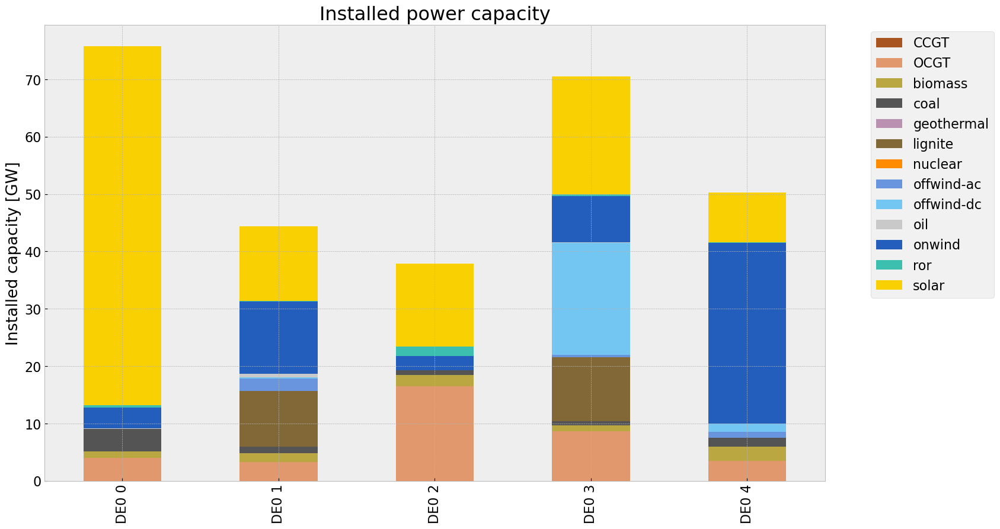

<Figure size 640x480 with 0 Axes>

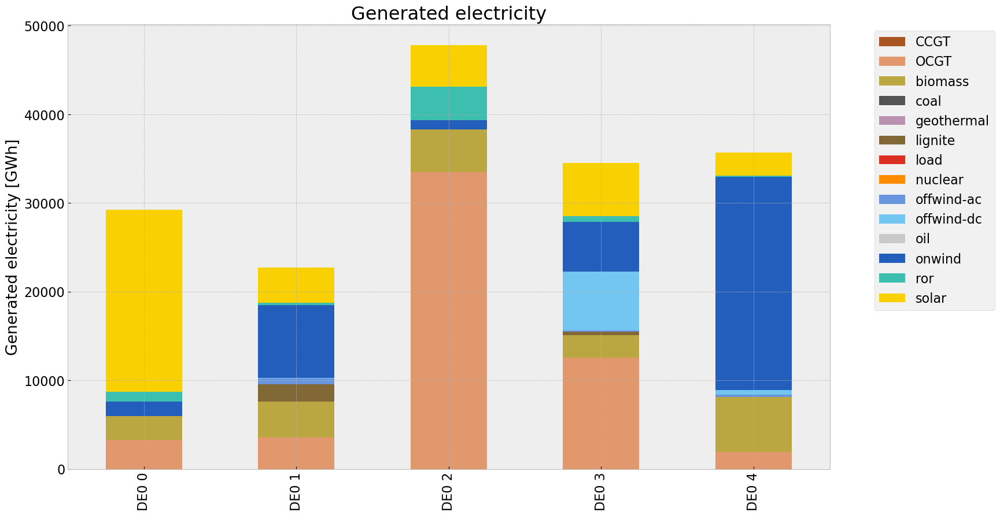

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\2820679995.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\2820679995.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.483700e+07,0.499437,0.1980,2.173994e+07
biomass,2.020635e+07,0.468000,0.0000,0.000000e+00
coal,1.103975e+02,0.329632,0.3361,1.125637e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,2.340880e+06,0.358368,0.4069,2.657898e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,1.028886e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


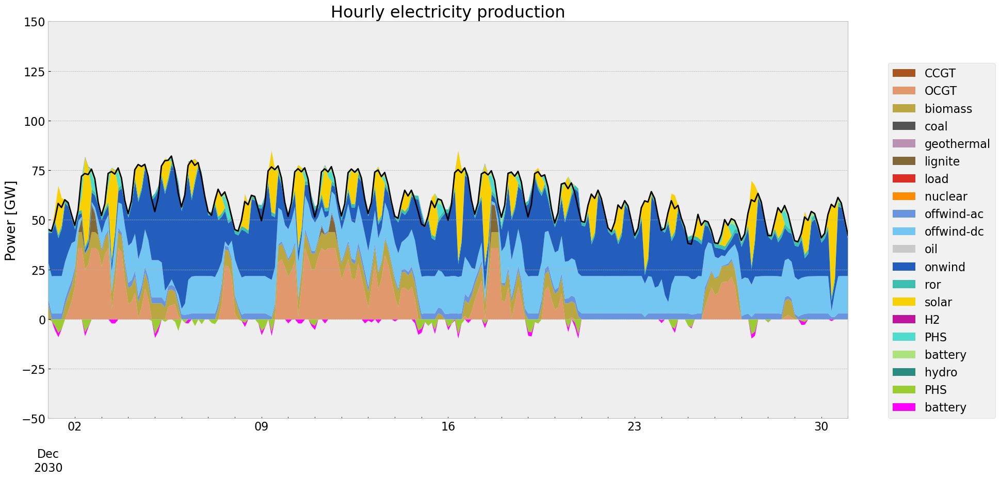

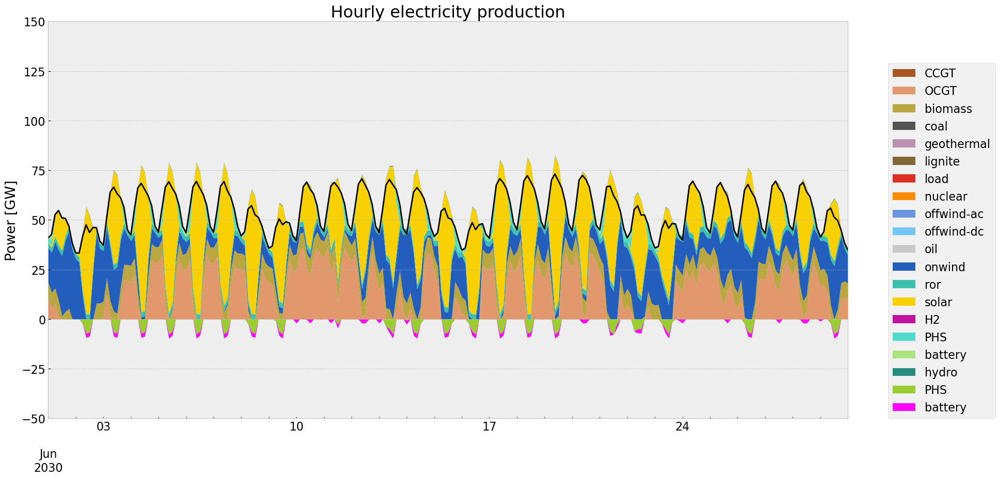

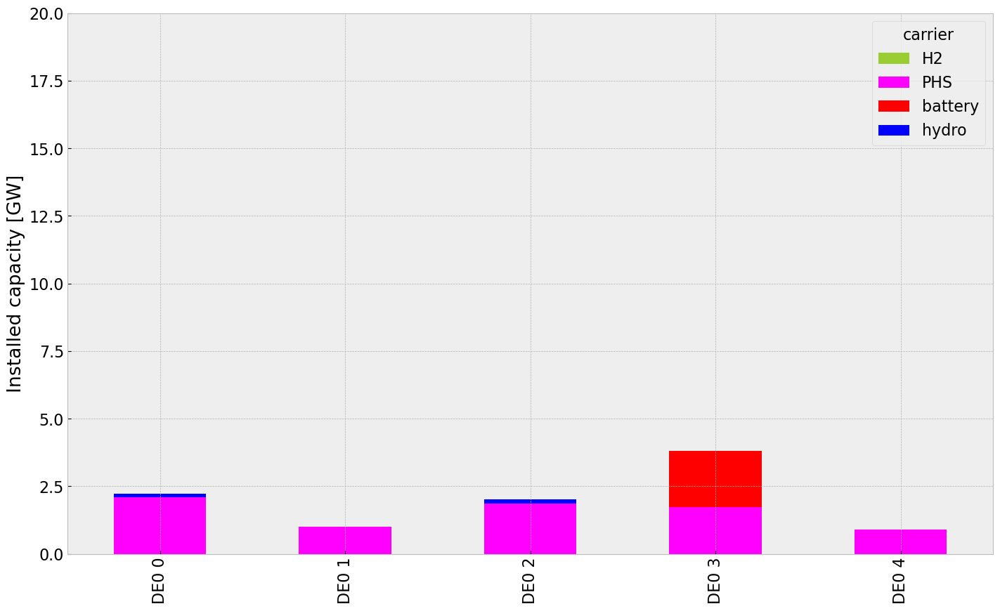

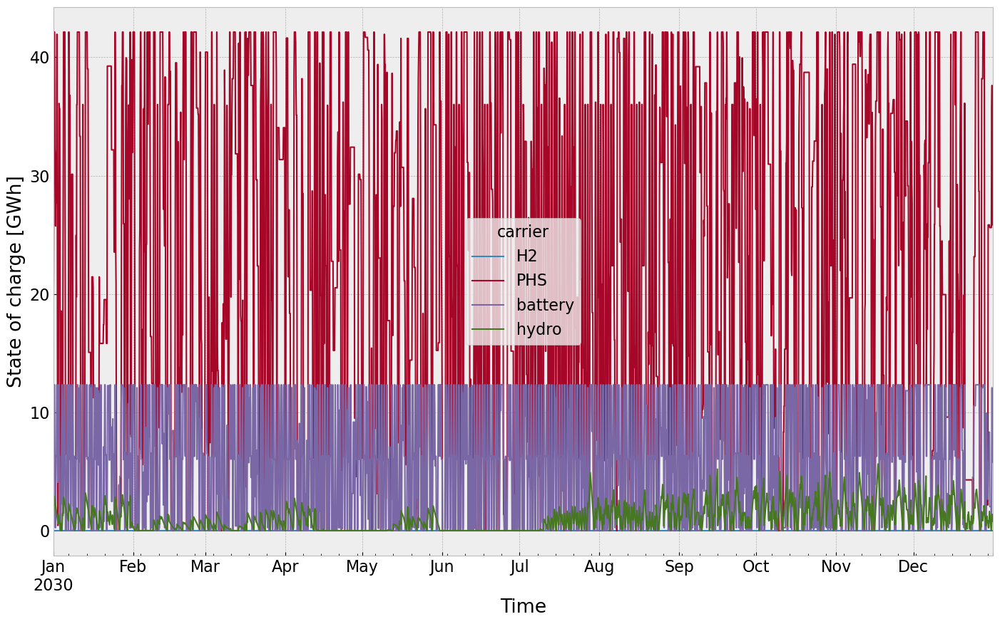

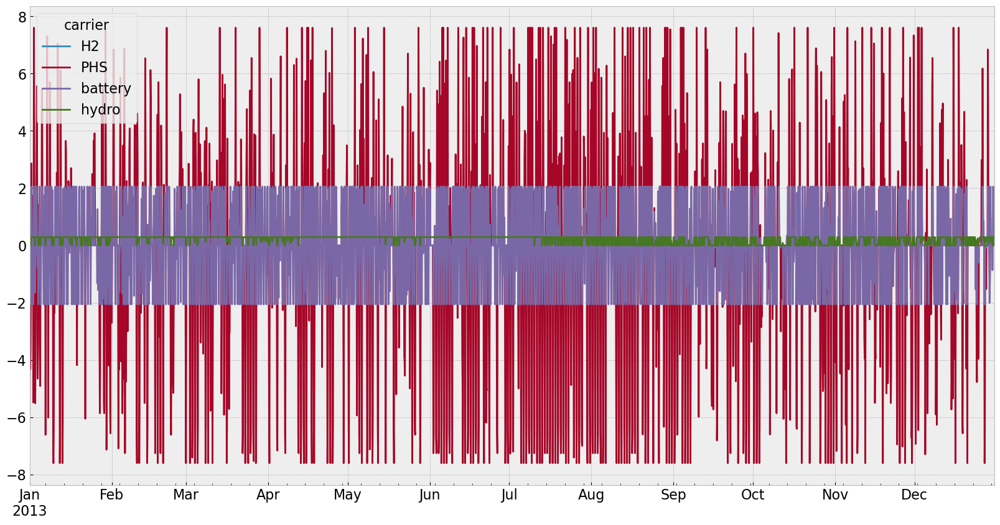

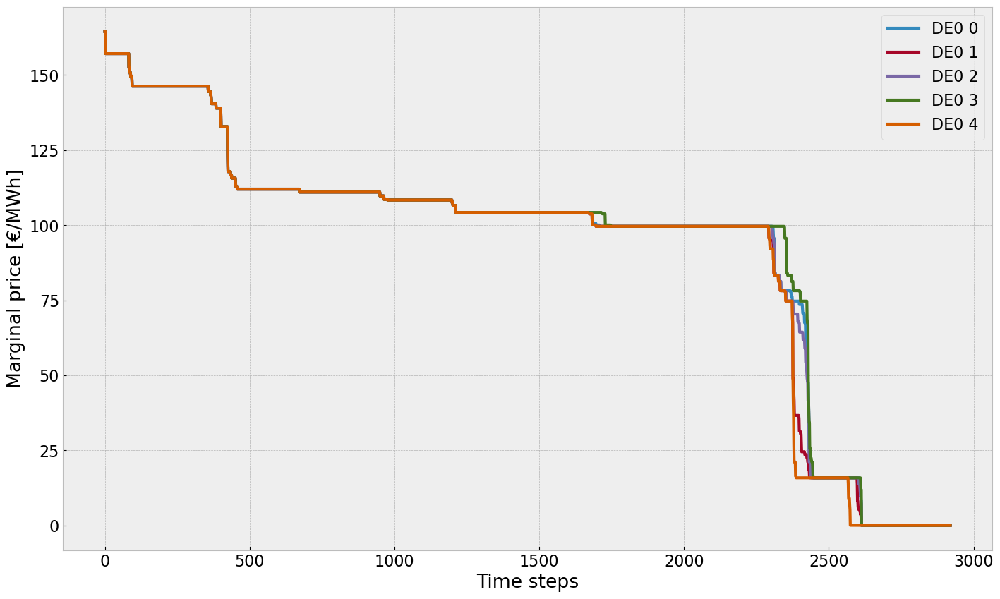

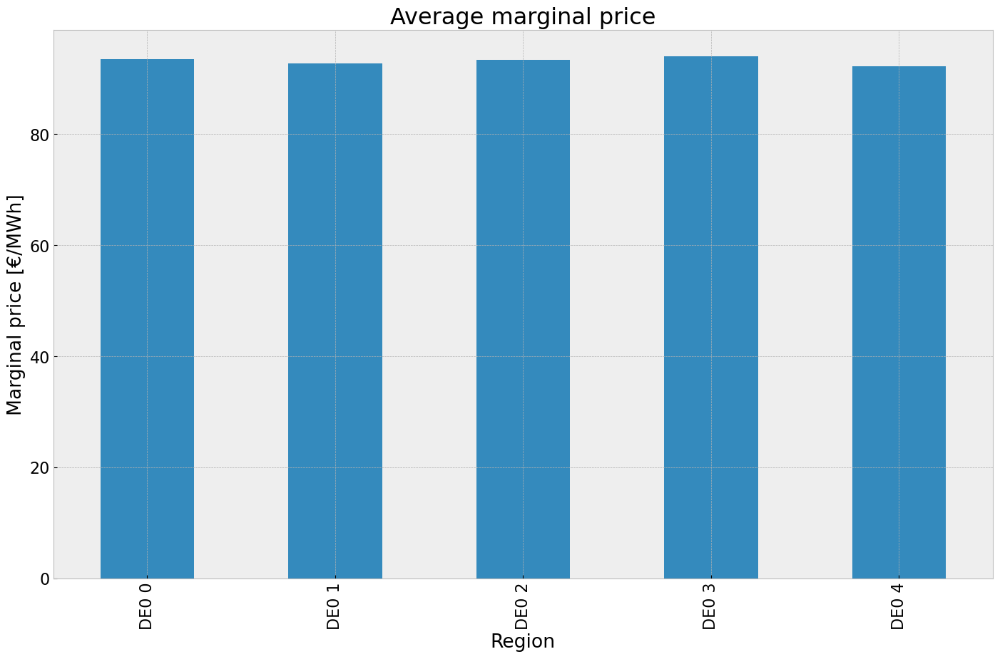

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


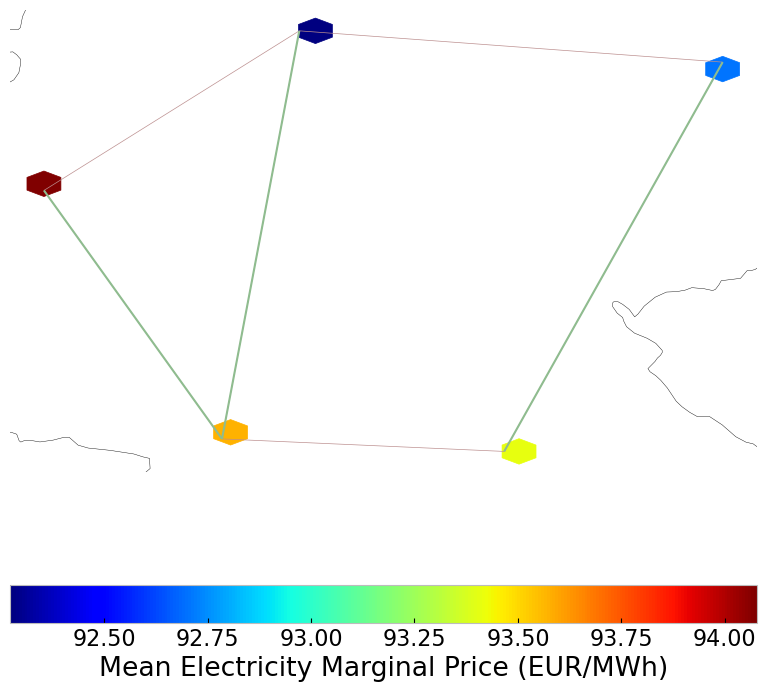

In [169]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

# Scenario Analysis

## Installed Capacity

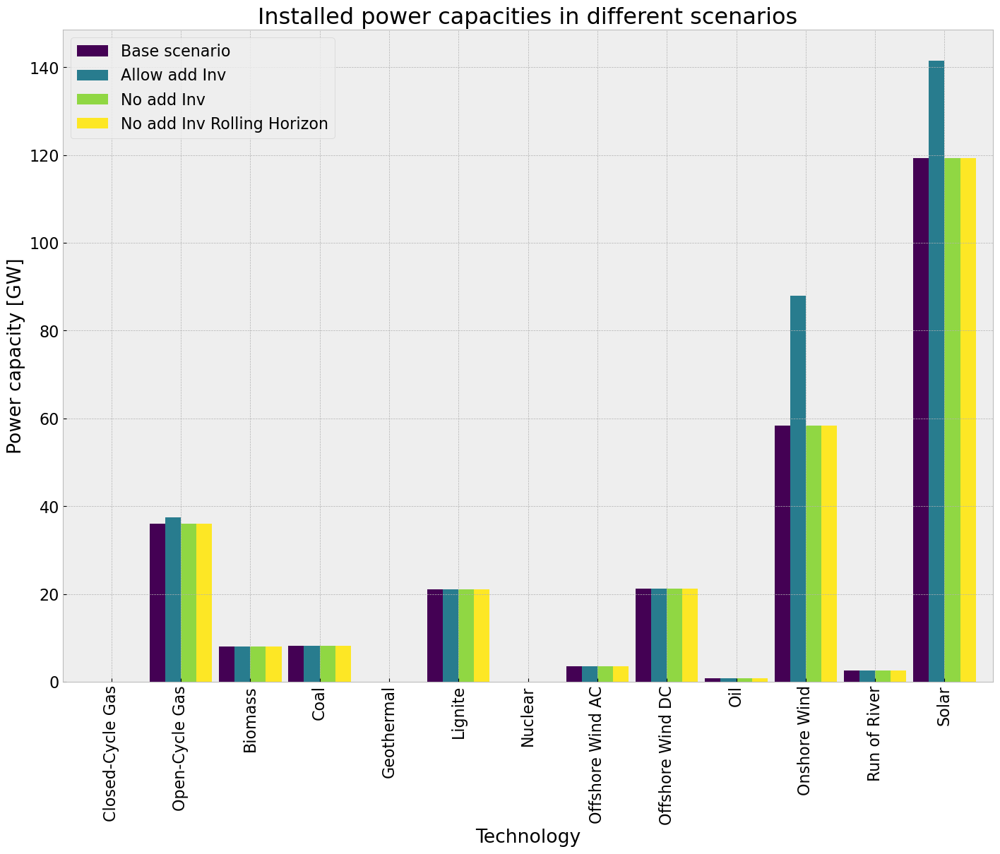

In [170]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [171]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,35.939257,37.521285,35.939257,35.939257
Biomass,8.011736,8.011736,8.011736,8.011736
Coal,8.158220,8.158220,8.158220,8.158220
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,20.999170,20.999170,20.999170,20.999170
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,3.464309,3.464309,3.464309,3.464309
Offshore Wind DC,21.180997,21.180997,21.180997,21.180997


## Power Generation

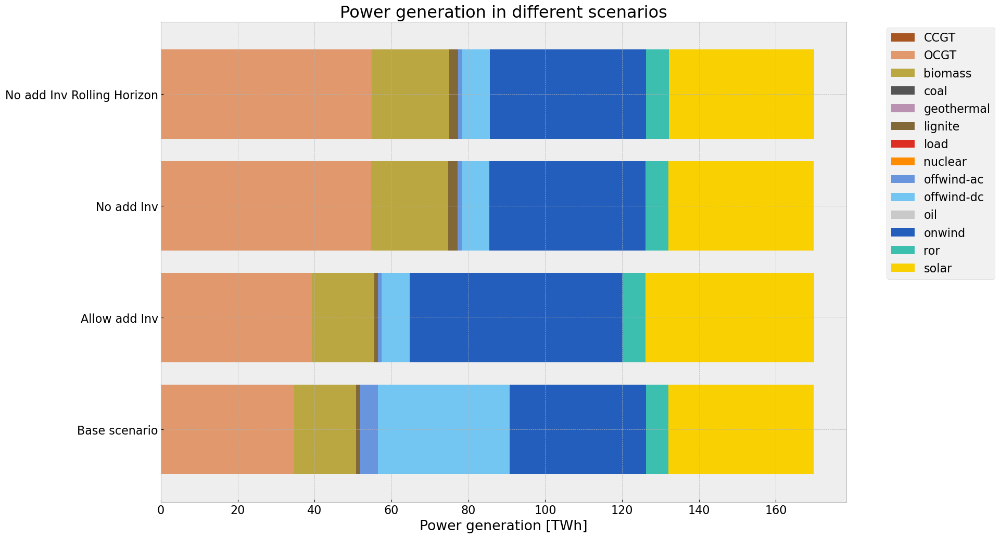

In [172]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [173]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


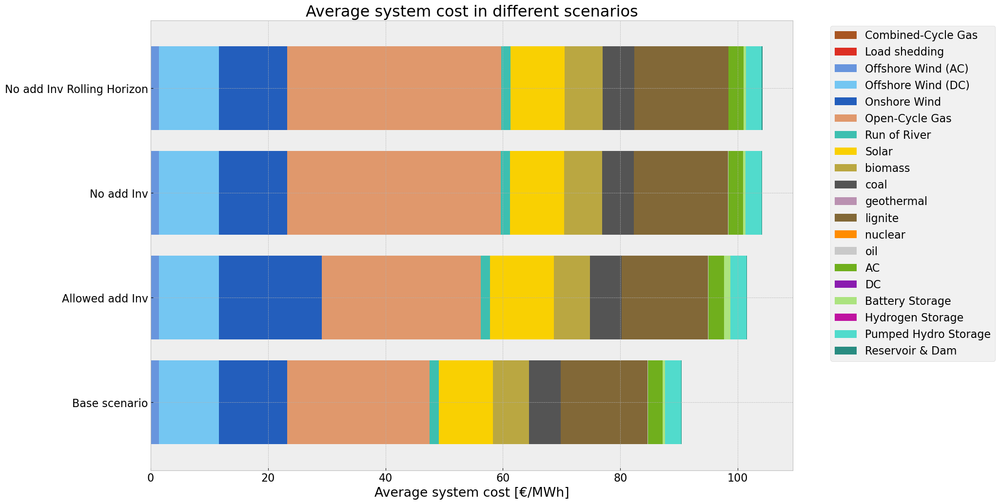

In [174]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [175]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [176]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


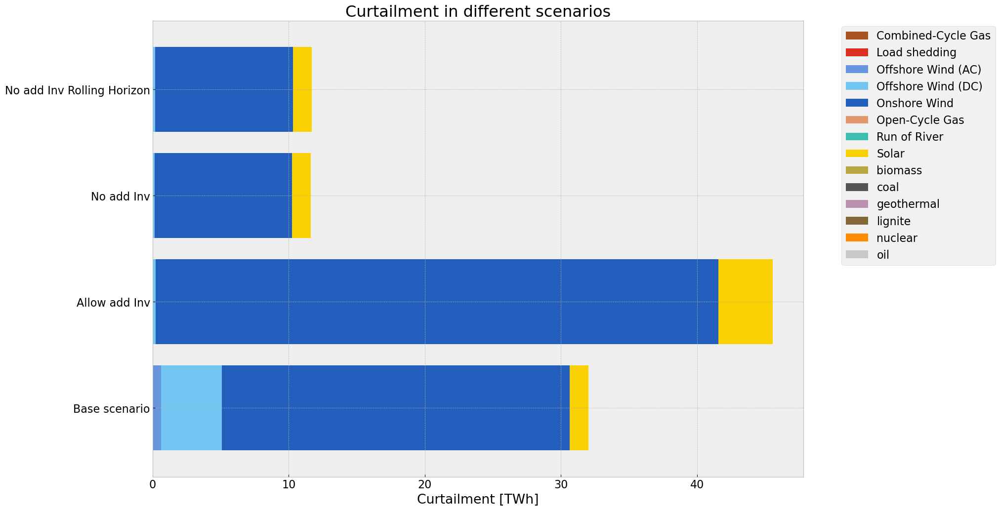

In [177]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_484\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


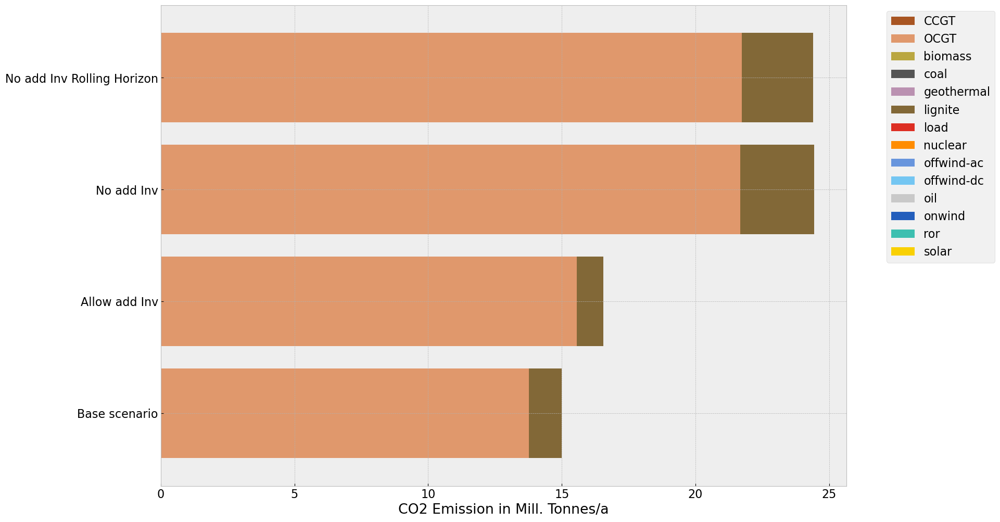

In [178]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()